In [162]:
!pip install sklearn
from ipfx.feature_extractor import (SpikeFeatureExtractor, SpikeTrainFeatureExtractor)


import pyabf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import glob
from itertools import compress
from scipy.signal import find_peaks
from scipy.signal import peak_widths
from scipy.signal import peak_prominences
from scipy.optimize import curve_fit
from scipy.stats import linregress
import scipy.stats
import pandas as pd
import seaborn as sns
sns.set()
 
pd.set_option('display.max_columns', None)

# Function to calculate dv/dt
def dv_dt (abf, sweep, sampling_rate, half_window_ms):
    # Select the trace in your recording
    sweep = abf.setSweep(sweepNumber=sweep, channel=0)
    # Identify the action potential with highest dV
    dv = np.diff(abf.sweepY)
    dv_max = np.argmax(dv)

    print(abf.sweepX[dv_max])
    # Set the time window for the selected action potential
    sampling_rate = sampling_rate
    half_window_ms = half_window_ms
    half_window = (half_window_ms * sampling_rate)//1000
    global t_window
    t_window = abf.sweepX[dv_max-half_window:dv_max+half_window]
    v_window = abf.sweepY[dv_max-half_window:dv_max+half_window]
    # Calculate dv_dt for the selected action potential
    dv_ap = np.diff(v_window)
    dt_ap = np.diff(t_window*1000)
    dv_dt = (dv_ap)/(dt_ap)
    dv_dt_max = np.amax(dv_dt)
    # Remove the first v value to match the dv/dt array which is n-1
    v_ap_array = np.delete(v_window, 1)
    # Return the selected outputs from the function
    return {'voltage': v_window, 'dv_dt': dv_dt, 
            'dv_dt_max': dv_dt_max, 'time': t_window,
            'voltage_array': v_ap_array}

# Define the logarithmic function
def logarithmic_function(x, a, b):
    return a * np.log(x) + b


def spike_analysis(abf_file):
    name = str(abf_file)
    folder_path = abf_file.split('/')
    file_name = folder_path[-1]
    file_name = file_name[:-4]
    print(file_name)
    parts = file_name.split('_')
    date = parts[0] + parts[1] + parts[2]
    protocol_num = parts[3]
    slice_num = parts[4]
    cell_num = parts[5]
    region = parts[6]
    layer = parts[7]
    treatment = parts[8]
    cell_type = parts[9]
    genotype = parts[10]
    rheobase = None
    abf = pyabf.ABF(abf_file)
    # Set the table from the dataframe below
    dataframe = [] 
    abf.setSweep(0)
    time = abf.sweepX
    voltage = abf.sweepY
    current = abf.sweepC
    start_index = None
    for i in range(len(current)):
        if current[i] != 0:
            start_index = i
            start = time[i]
            break
    end_index = None
    for i in range(len(current[start_index:])):
        if current[start_index+i] == 0:
            end_index = i+5+start_index
            end = time[i+5+start_index]
            break
    # Loop function to analyze each voltage trace of the file
    for sweepNumber in abf.sweepList:
        if rheobase == None:
            pass
        else:
            if sweepNumber > rheobase + 10:
                break
        #if sweepNumber == 33:
        #    break
        abf.setSweep(sweepNumber)
        time = abf.sweepX
        voltage = abf.sweepY
        current = abf.sweepC
        # Parameters for analysis: 
        sfx = SpikeFeatureExtractor (start, end, 
                                     filter=None, # cutoff frequency for 4-pole low-pass Bessel filter in kHz 
                                     dv_cutoff=25.0,  # minimum dV/dt to qualify as a spike in V/s 
                                     thresh_frac=0.05,  # fraction of average upstroke for threshold calculation
                                     min_peak=0)  
        sfx_results = sfx.process(time, voltage, current)
        if not sfx_results.empty:
            if rheobase == None:
                rheobase = sweepNumber
            else:
                pass
            x_vals = time[start_index:sfx_results['threshold_index'][0]]
            y_vals = voltage[start_index:sfx_results['threshold_index'][0]]
            params, _ = curve_fit(logarithmic_function, x_vals, y_vals)
            # Generate line of best fit
            x_fit = np.linspace(min(x_vals), max(x_vals), len(x_vals))
            y_fit = logarithmic_function(x_fit, *params)
            # Calculate R-squared value
            y_predicted = logarithmic_function(x_vals, *params)
            slope, intercept, r_value, p_value, std_err = linregress(y_vals, y_predicted)
            r_squared = r_value ** 2
            #if r_squared > 0.75:
            num_rows = sfx_results.shape[0]
            current = {'date': date, 'protocol_num': protocol_num, 'slice': slice_num, 'cell': cell_num, 'region': region, 'layer': layer, 'treatment': treatment, 'cell_type': cell_type, 'animal_genotype': genotype}
            current = pd.DataFrame([current])
            current = pd.concat([current] * num_rows, ignore_index=True)
            my_list = [sweepNumber] * num_rows
            r_squared_rise = [r_squared] * num_rows
            file_list = [file_name] * num_rows
            end_column = pd.Series(r_squared_rise, name='r_squared_rise')
            new_column = pd.Series(my_list, name='sweep')
            file_column = pd.Series(file_list, name = 'file_name')
            new_frame = pd.concat([current, file_column, new_column, sfx_results, end_column], axis = 1)
            dataframe.append(new_frame)  # To get the mean: df.append(sfx_results.mean())
            plt.plot(abf.sweepX, abf.sweepY, alpha=.6, label="sweep %d" % (sweepNumber))
            plt.scatter(sfx_results['peak_t'], sfx_results['peak_v'])
    plt.xlim(0.17, 1.2)
    plt.show()
    indiv_table = pd.concat(dataframe)
    return indiv_table
    
def input_output(abf_file):
    name = str(abf_file)
    folder_path = abf_file.split('/')
    file_name = folder_path[-1]
    file_name = file_name[:-4]
    print(file_name)
    parts = file_name.split('_')
    date = parts[0] + parts[1] + parts[2]
    protocol_num = parts[3]
    slice_num = parts[4]
    cell_num = parts[5]
    region = parts[6]
    layer = parts[7]
    treatment = parts[8]
    cell_type = parts[9]
    genotype = parts[10]
    abf = pyabf.ABF(abf_file)
    # Set the dataframe for the table
    table = pd.DataFrame()
    currents = [] # Current value between t1 and t2 (ms) for each step
    rheobase = None
    # Loop function to analyze each voltage and current trace of the file
    for sweep in abf.sweepList:
        if rheobase == None:
            pass
        else:
            if sweep > rheobase + 10:
                break
        #if sweep == 33:
        #    break    
        abf.setSweep(sweep)
        time = abf.sweepX
        voltage = abf.sweepY
        current = abf.sweepC
        
        t1 = int(400*abf.dataPointsPerMs) 
        t2 = int(500*abf.dataPointsPerMs)
        current_mean = np.average(abf.sweepC[t1:t2])
        currents.append(np.average(abf.sweepC[t1:t2]))
        start, end = 0.17, 1.2
        sfx = SpikeFeatureExtractor (start, end, 
                                 filter=None, # cutoff frequency for 4-pole low-pass Bessel filter in kHz 
                                 dv_cutoff=25.0,  # minimum dV/dt to qualify as a spike in V/s 
                                 thresh_frac=0.05,  # fraction of average upstroke for threshold calculation
                                 min_peak=0) 
        sfx_results = sfx.process(time, voltage, current)
        if not sfx_results.empty:
            if rheobase == None:
                rheobase = sweep
            else:
                pass
        stfx = SpikeTrainFeatureExtractor (start=start, end=end)
        stfx_results = stfx.process(time, voltage, current, sfx_results)

        # Create a table with the stfx results
        length = len(table)
        table.loc[length, 'current_step'] = current_mean
        table.loc[length, 'avg_rate'] = stfx_results["avg_rate"]
        current = {'date': date, 'protocol_num': protocol_num, 'slice': slice_num, 'cell': cell_num, 'region': region, 'layer': layer, 'treatment': treatment, 'cell_type': cell_type, 'animal_genotype': genotype}
        current = pd.DataFrame([current])
        for col in current.columns:
            table.loc[length, col] = current[col].values[0]
        if stfx_results ['avg_rate'] > 0:
            table.loc[length, 'adaptation'] = stfx_results ["adapt"]
            table.loc[length, 'Latency_s'] = stfx_results ["latency"]
            table.loc[length, 'ISI_CV'] = stfx_results ["isi_cv"]
            table.loc[length, 'ISI_mean_ms'] = stfx_results ["mean_isi"]*1000
            table.loc[length, 'ISI_first_ms'] = stfx_results ["first_isi"]*1000
            
    # Optional Plotting: example with three subplots
    fig = plt.figure(figsize=(15, 5))
    # Input-output curve
    ax1 = fig.add_subplot(1, 2, 1)
    ax1.scatter(currents, table.loc[:,'avg_rate'])
    ax1.set_xlabel('Current step (pA)')
    ax1.set_ylabel('Action potentials')

    # All traces
    ax2 = fig.add_subplot(2, 2, 2)
    for sweep in abf.sweepList:
        abf.setSweep(sweep)
        ax2.plot(abf.sweepX, abf.sweepY, alpha=.6, label="Sweep %d" % (sweep))
    ax2.set_ylabel('Membrane voltage (mV)')
    # ax2.legend() # Optional
    # To highllight one trace
    abf.setSweep(3) 
    ax2.plot(abf.sweepX, abf.sweepY, linewidth=1, color='black')
    ax2.axes.set_xlim(0, 1.1) # Range of the x-axis (seconds)

    # All current steps
    ax3 = fig.add_subplot(2, 2, 4, sharex=ax2) 
    for sweep in abf.sweepList:
        abf.setSweep(sweep)
        current = abf.sweepC
        ax3.plot(abf.sweepX, current)
    ax3.set_ylabel("Current (pA)")
    ax3.set_xlabel("Time (s)")
    # To highllight one current trace
    abf.setSweep(3) 
    ax3.plot(abf.sweepX, abf.sweepC, linewidth=1, color='black')
    fig.tight_layout()
    # Show the graph and the table results 
    plt.show()
    return table



2023_09_27_0065_slice5_cell1_cortex_layer2_100um-citrate_PN_WT


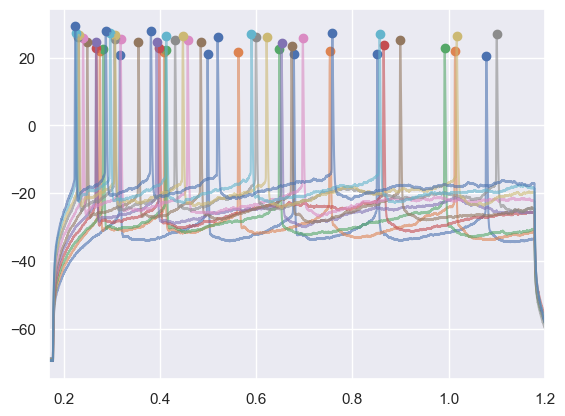

2023_09_27_0065_slice5_cell1_cortex_layer2_100um-citrate_PN_WT


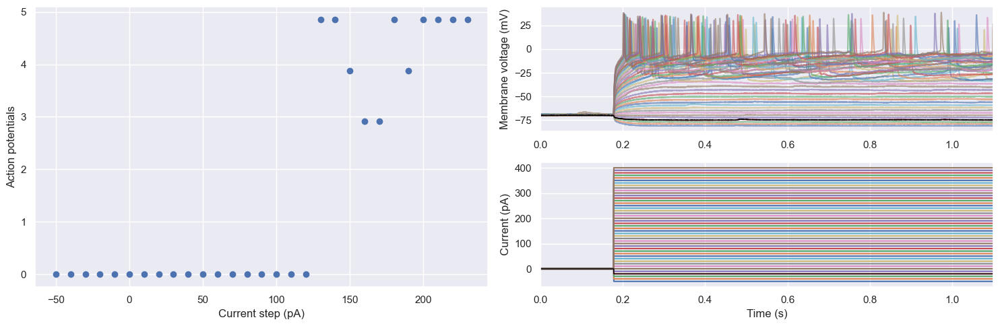

2023_09_20_0036_slice1_cell1_cortex_layer2_washout_PN_WT


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


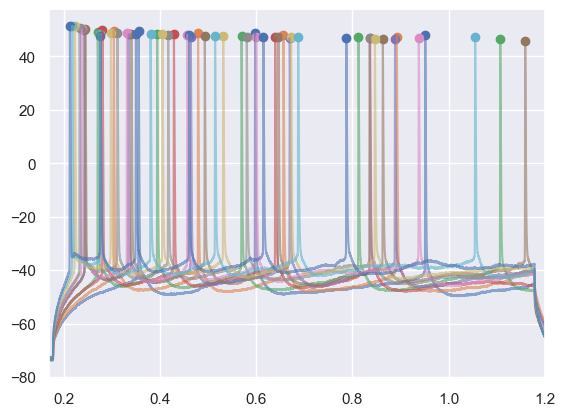

2023_09_20_0036_slice1_cell1_cortex_layer2_washout_PN_WT


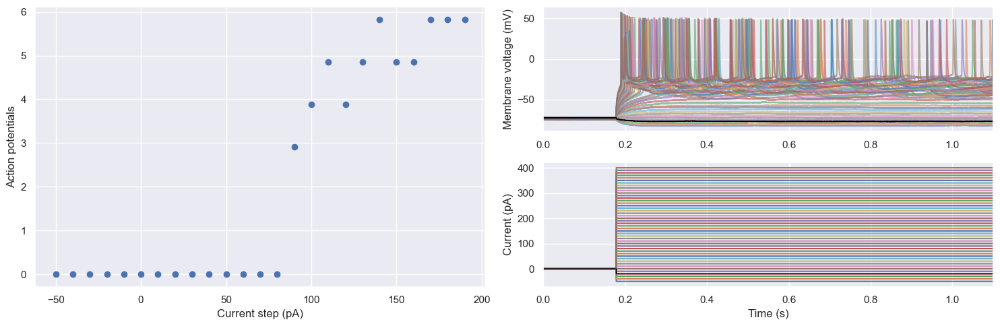

2023_09_27_0019_slice2_cell1_cortex_layer2_100um-citrate_MSN_WT


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


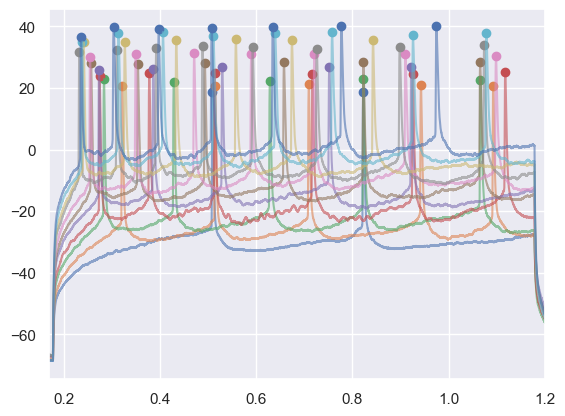

2023_09_27_0019_slice2_cell1_cortex_layer2_100um-citrate_MSN_WT


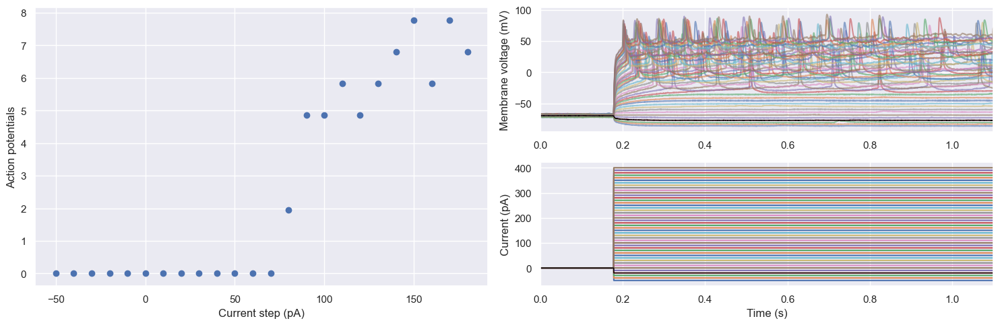

2023_10_01_0028_slice2_cell1_cortex_layer2_no-treatment_MSN_KO


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


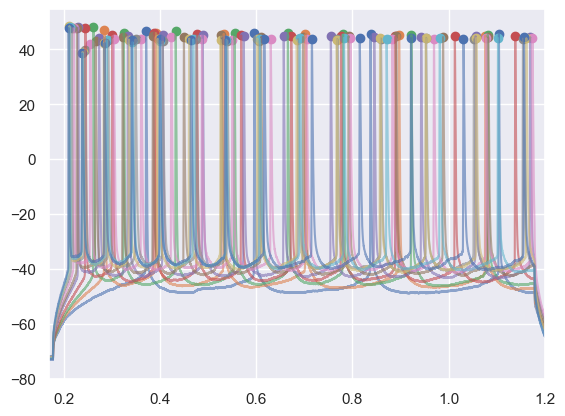

2023_10_01_0028_slice2_cell1_cortex_layer2_no-treatment_MSN_KO


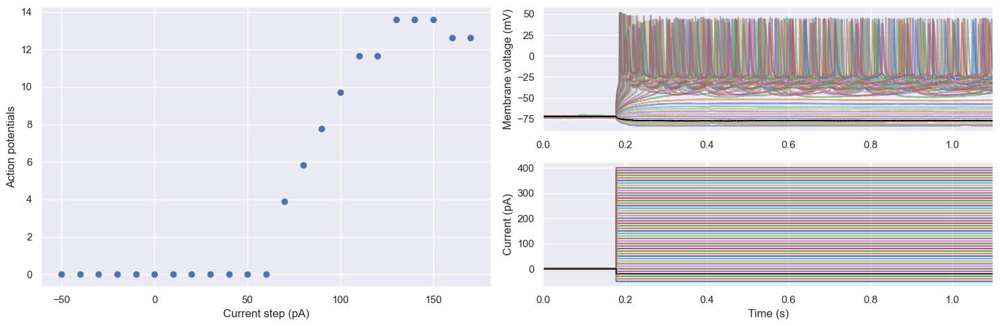

2023_09_27_0059_slice5_cell1_cortex_layer2_25um-citrate_PN_WT


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


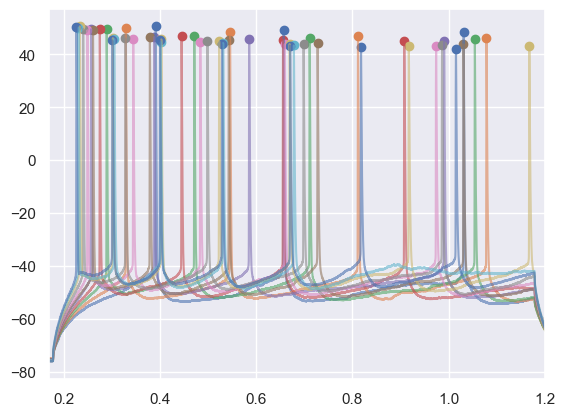

2023_09_27_0059_slice5_cell1_cortex_layer2_25um-citrate_PN_WT


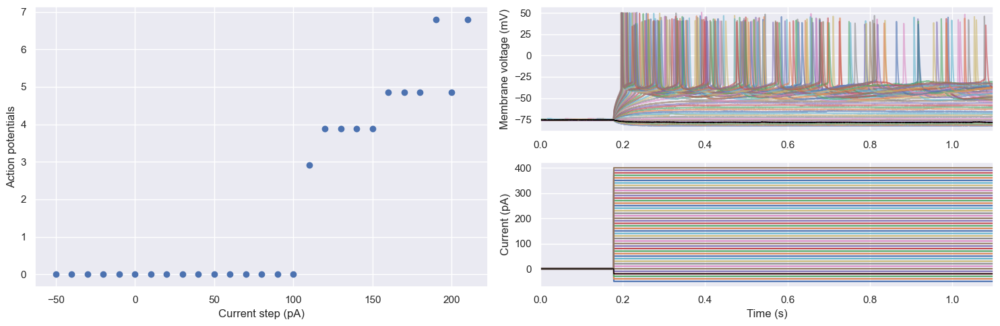

2023_10_01_0031_slice2_cell1_cortex_layer2_25um-citrate_MSN_KO


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


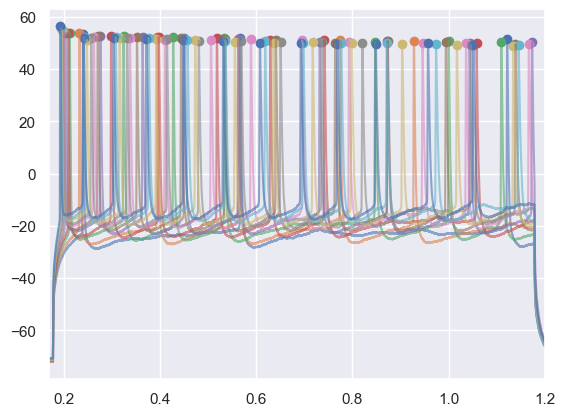

2023_10_01_0031_slice2_cell1_cortex_layer2_25um-citrate_MSN_KO


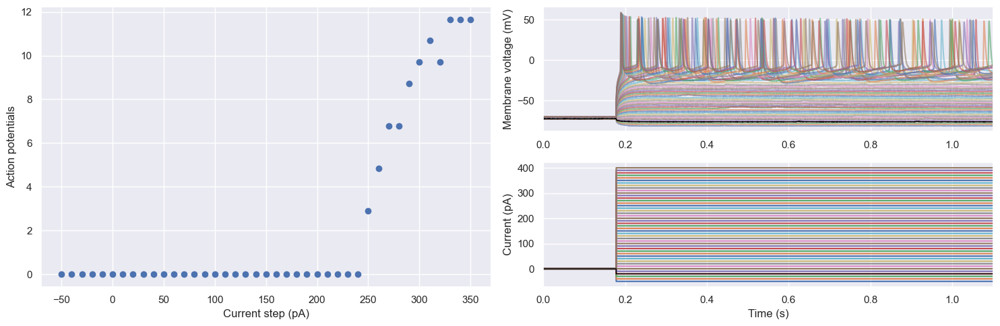

2023_09_20_0024_slice1_cell1_cortex_layer2_50um-citrate_PN_WT


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


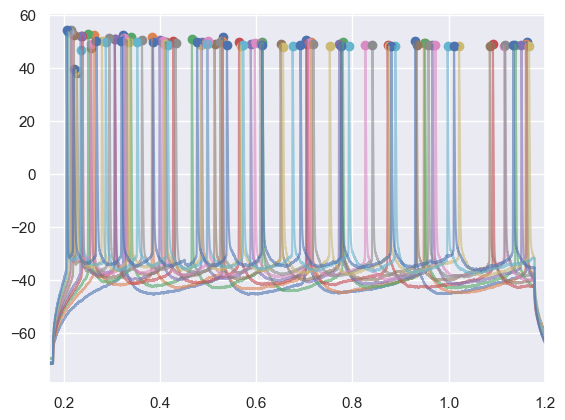

2023_09_20_0024_slice1_cell1_cortex_layer2_50um-citrate_PN_WT


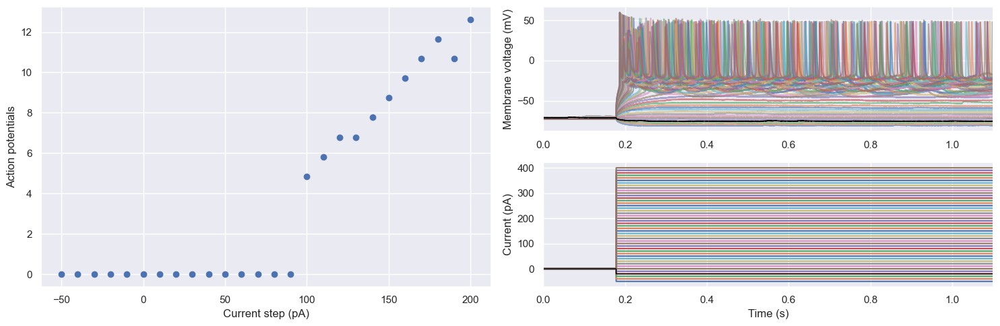

2023_09_20_0052_slice3_cell2_cortex_layer2_100um-citrate_PN_WT


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


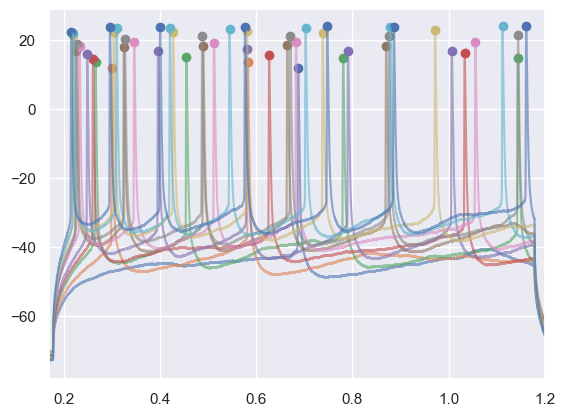

2023_09_20_0052_slice3_cell2_cortex_layer2_100um-citrate_PN_WT


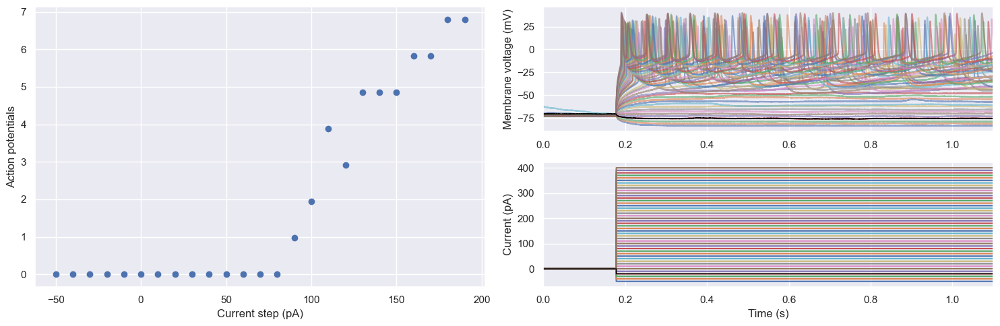

2023_09_27_0051_slice4_cell1_cortex_layer2_200um-citrate_MSN_WT


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


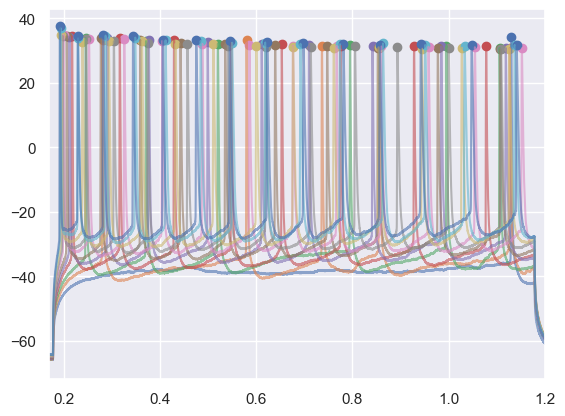

2023_09_27_0051_slice4_cell1_cortex_layer2_200um-citrate_MSN_WT


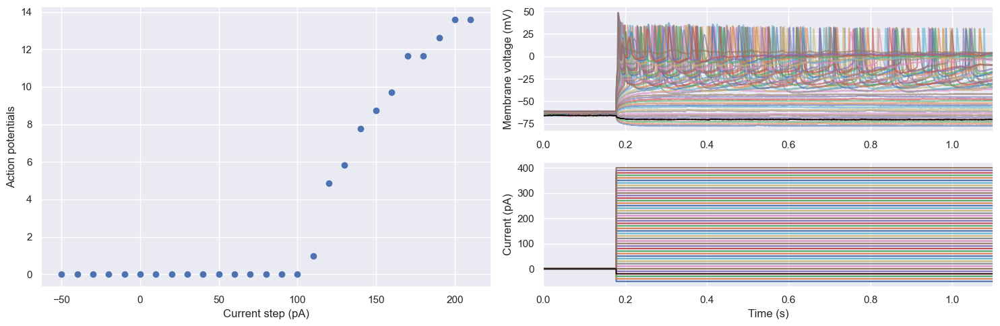

2023_09_27_0062_slice5_cell1_cortex_layer2_50um-citrate_PN_WT


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


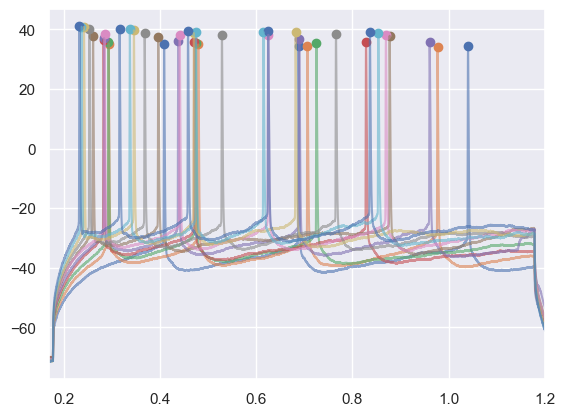

2023_09_27_0062_slice5_cell1_cortex_layer2_50um-citrate_PN_WT


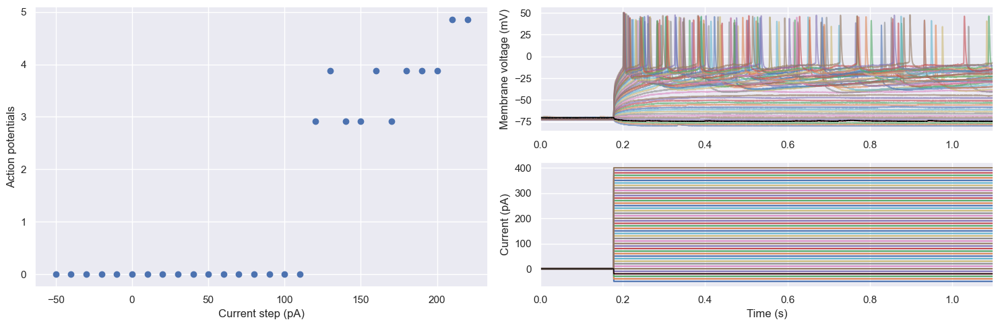

2023_09_21_0000_slice3_cell2_cortex_layer2_400um-citrate_PN_WT


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


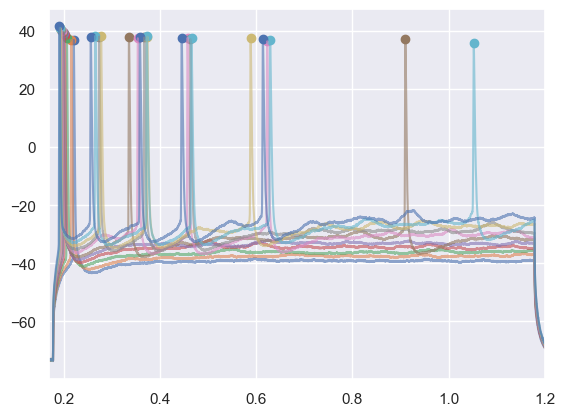

2023_09_21_0000_slice3_cell2_cortex_layer2_400um-citrate_PN_WT


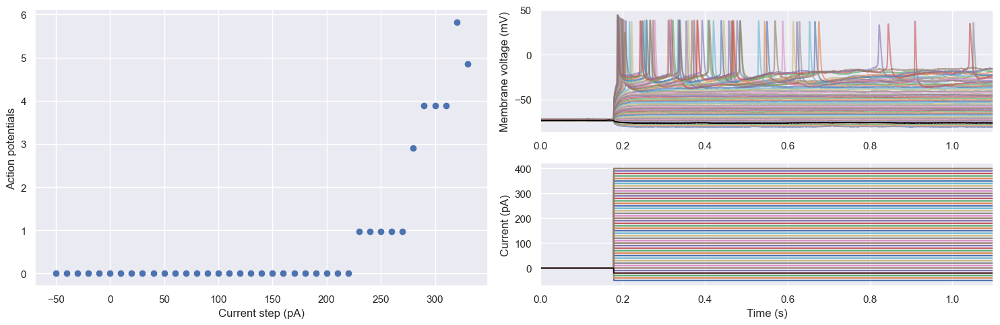

2023_09_27_0048_slice4_cell1_cortex_layer2_100um-citrate_MSN_WT


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


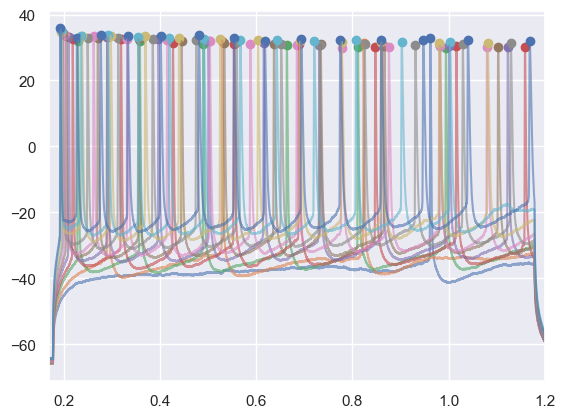

2023_09_27_0048_slice4_cell1_cortex_layer2_100um-citrate_MSN_WT


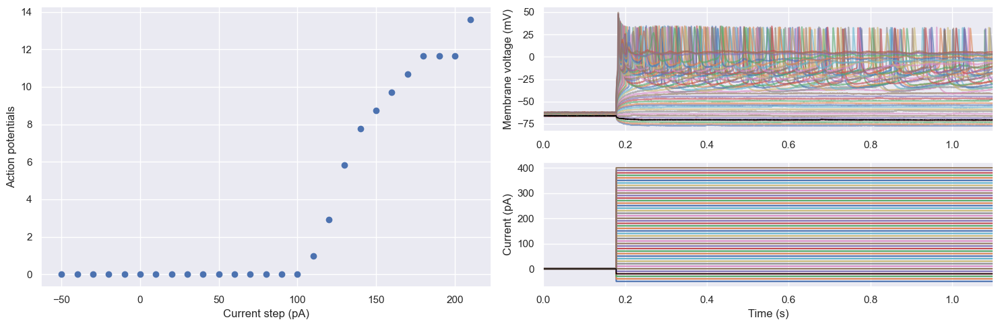

2023_09_20_0049_slice3_cell2_cortex_layer2_50um-citrate_PN_WT


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


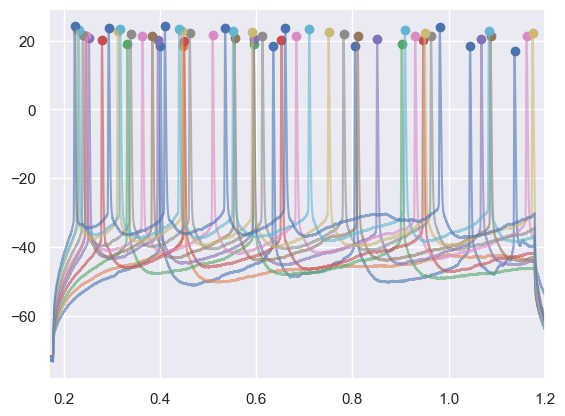

2023_09_20_0049_slice3_cell2_cortex_layer2_50um-citrate_PN_WT


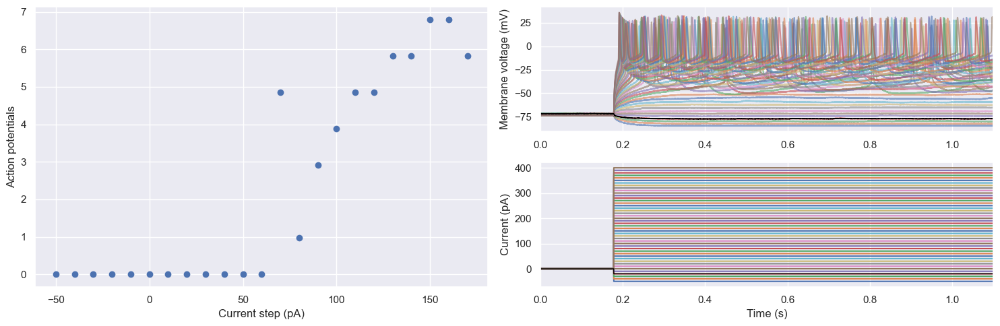

2023_09_27_0045_slice4_cell1_cortex_layer2_50um-citrate_MSN_WT


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


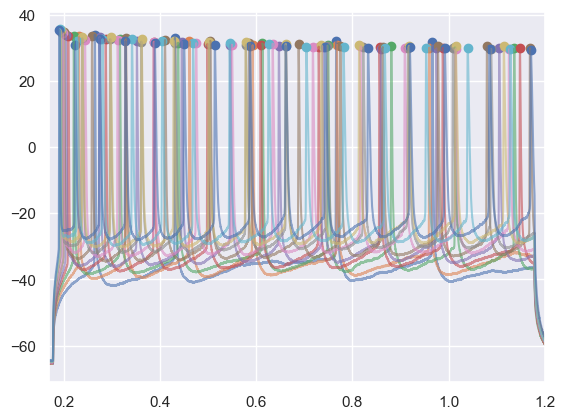

2023_09_27_0045_slice4_cell1_cortex_layer2_50um-citrate_MSN_WT


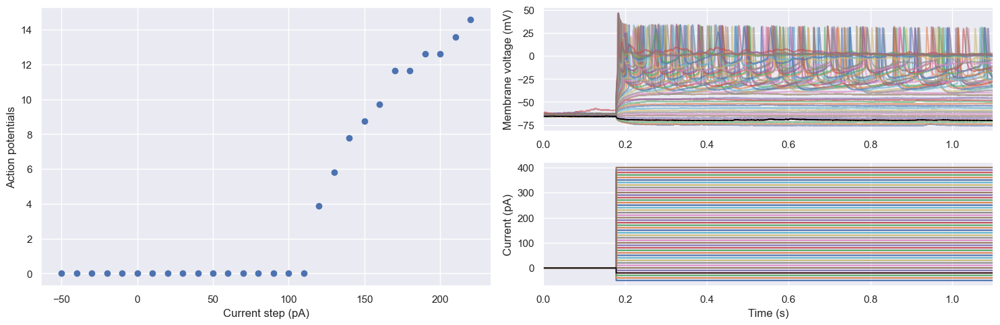

2023_10_01_0035_slice2_cell1_cortex_layer2_100um-citrate_MSN_KO


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


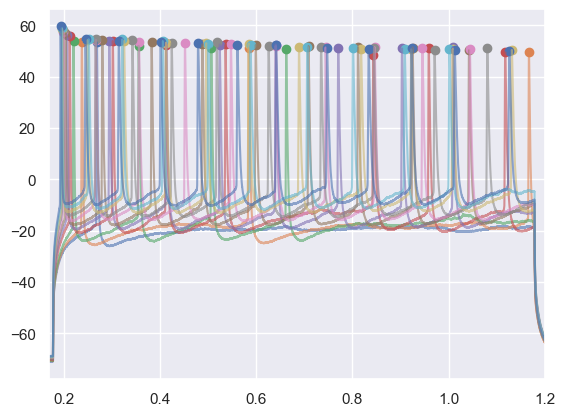

2023_10_01_0035_slice2_cell1_cortex_layer2_100um-citrate_MSN_KO


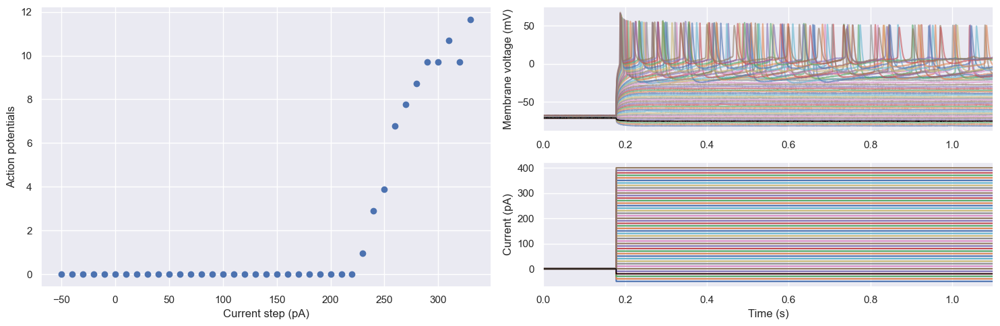

2023_09_20_0018_slice1_cell1_cortex_layer2_no-treatment_PN_WT


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


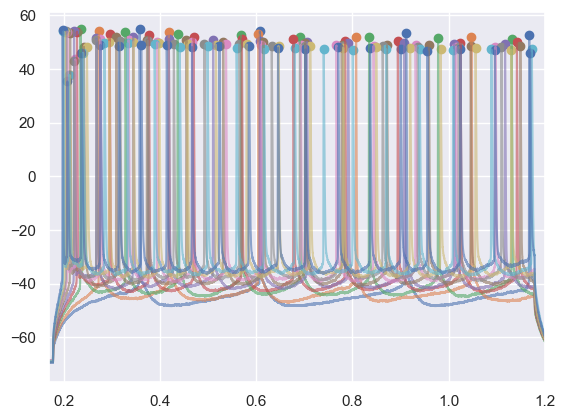

2023_09_20_0018_slice1_cell1_cortex_layer2_no-treatment_PN_WT


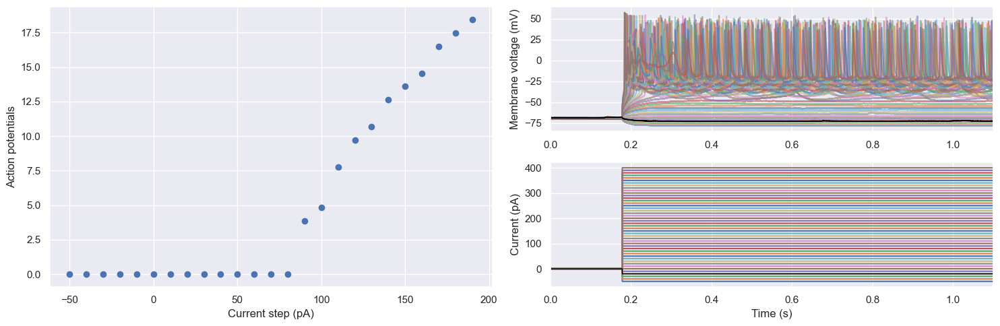

2023_09_20_0021_slice1_cell1_cortex_layer2_25um-citrate_PN_WT


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


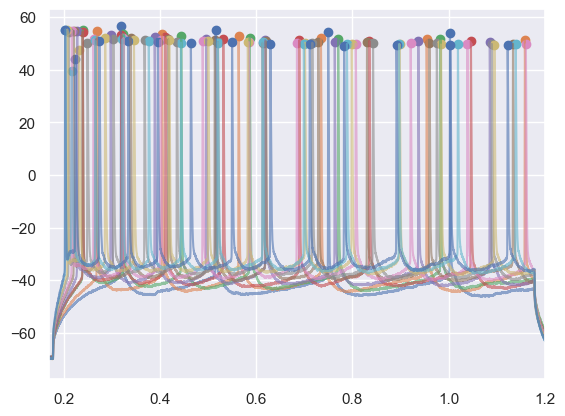

2023_09_20_0021_slice1_cell1_cortex_layer2_25um-citrate_PN_WT


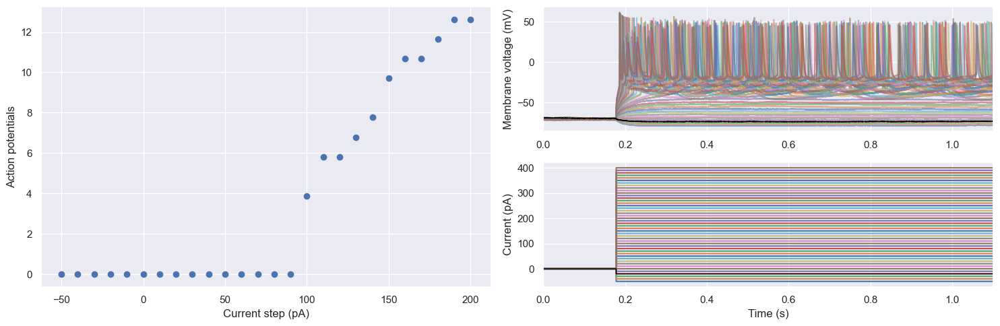

2023_09_20_0031_slice1_cell1_cortex_layer2_200um-citrate_PN_WT


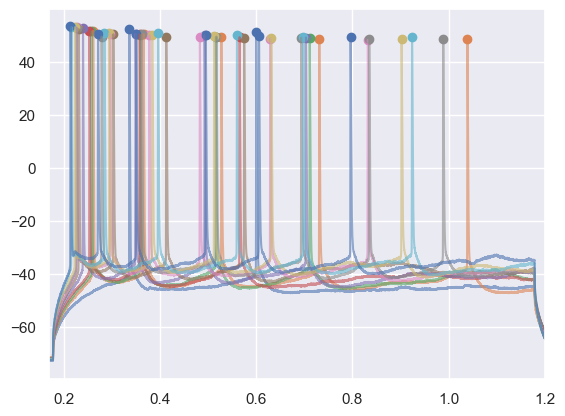

2023_09_20_0031_slice1_cell1_cortex_layer2_200um-citrate_PN_WT


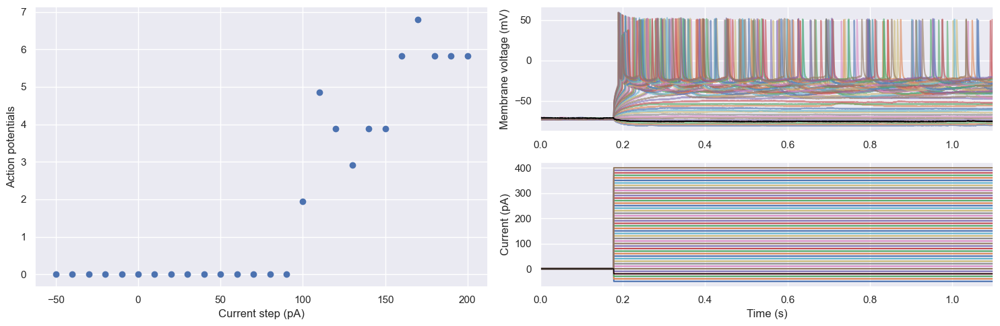

2023_09_27_0039_slice4_cell1_cortex_layer2_no-treatment_MSN_WT


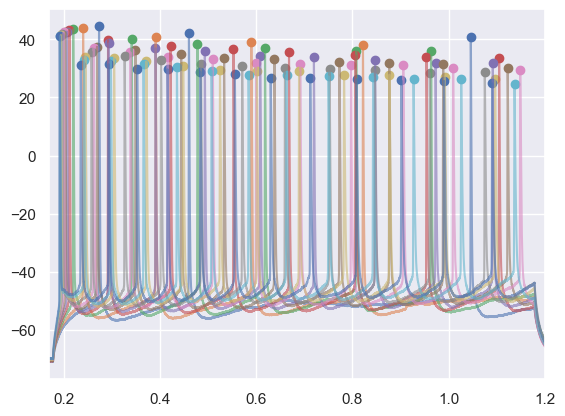

2023_09_27_0039_slice4_cell1_cortex_layer2_no-treatment_MSN_WT


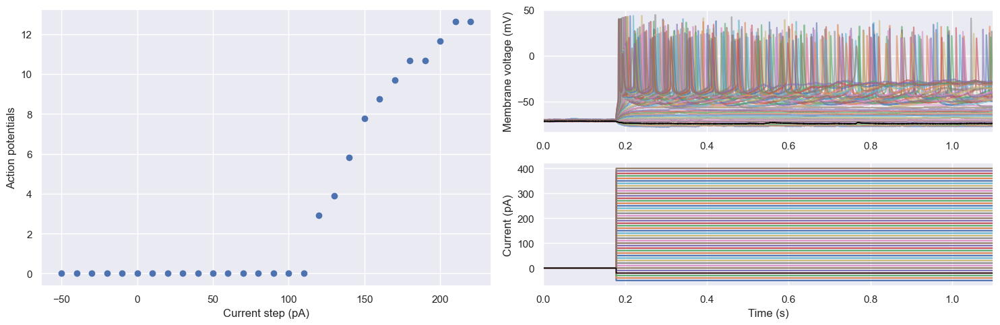

2023_09_20_0046_slice3_cell2_cortex_layer2_25um-citrate_PN_WT


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


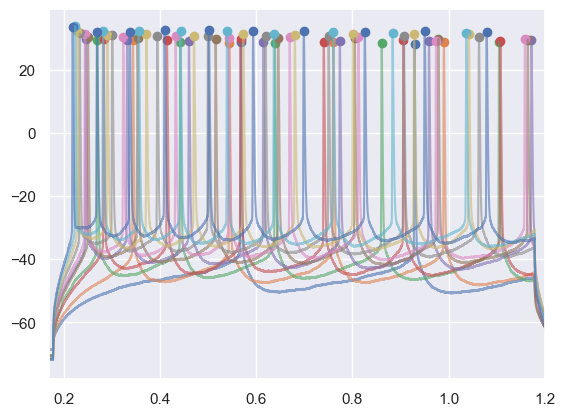

2023_09_20_0046_slice3_cell2_cortex_layer2_25um-citrate_PN_WT


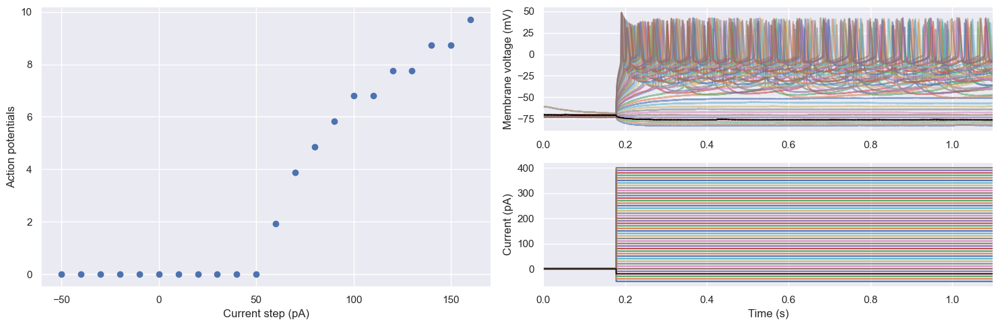

2023_09_27_0010_slice2_cell1_cortex_layer2_no-treatment_MSN_WT


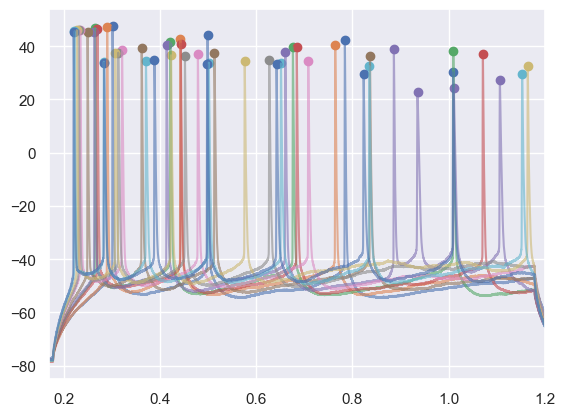

2023_09_27_0010_slice2_cell1_cortex_layer2_no-treatment_MSN_WT


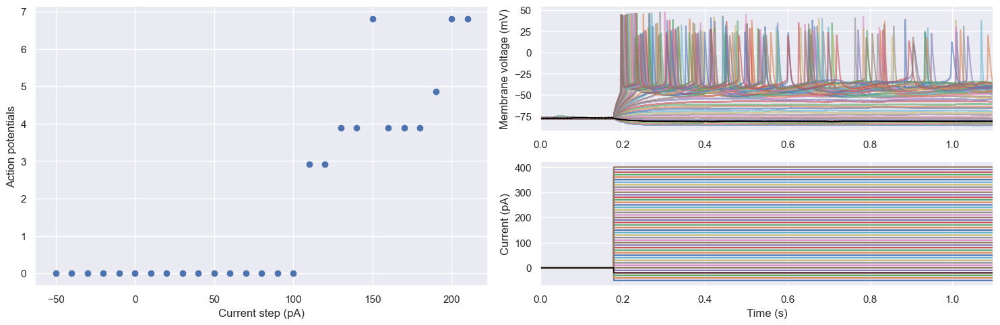

2023_09_27_0016_slice2_cell1_cortex_layer2_50um-citrate_MSN_WT


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


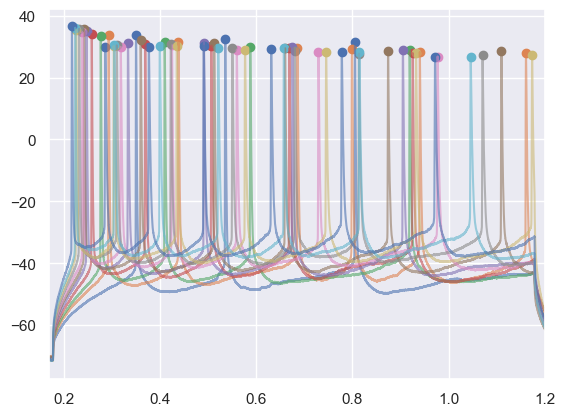

2023_09_27_0016_slice2_cell1_cortex_layer2_50um-citrate_MSN_WT


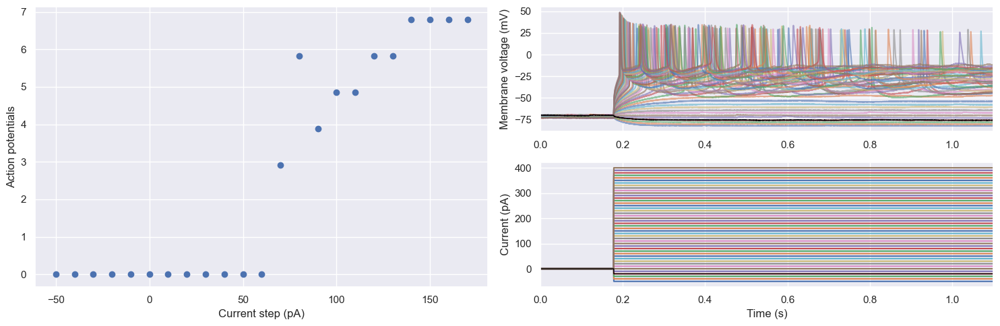

2023_09_27_0071_slice5_cell1_cortex_layer2_400um-citrate_PN_WT


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


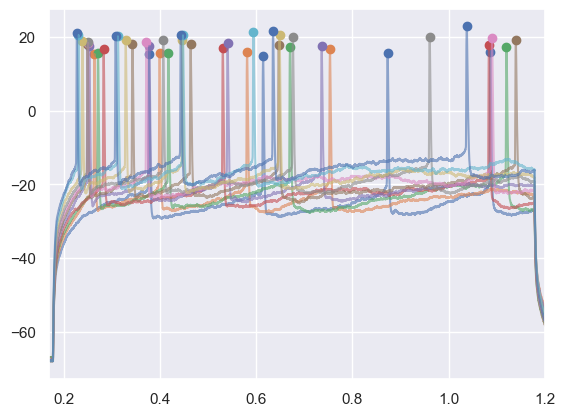

2023_09_27_0071_slice5_cell1_cortex_layer2_400um-citrate_PN_WT


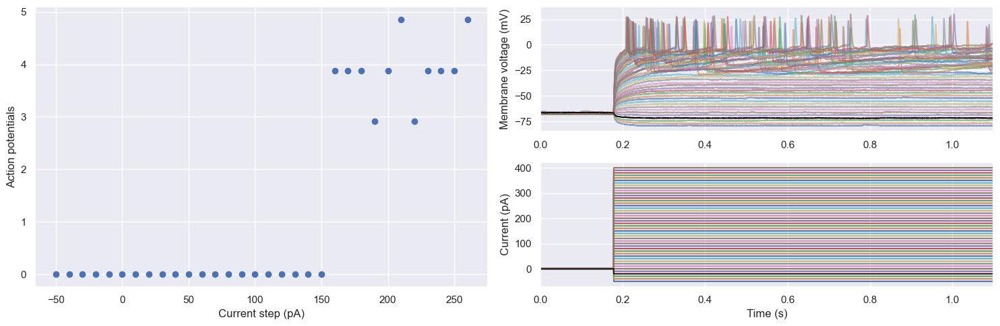

2023_09_27_0013_slice2_cell1_cortex_layer2_25um-citrate_MSN_WT


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


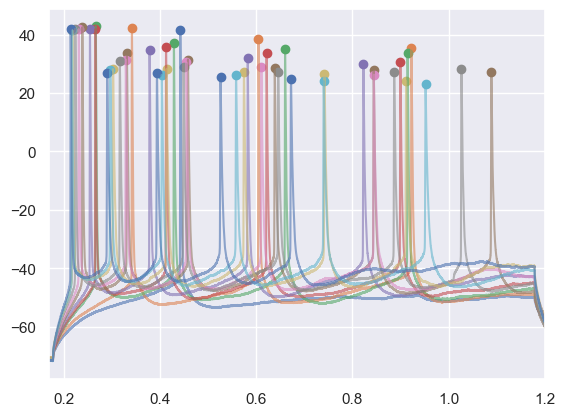

2023_09_27_0013_slice2_cell1_cortex_layer2_25um-citrate_MSN_WT


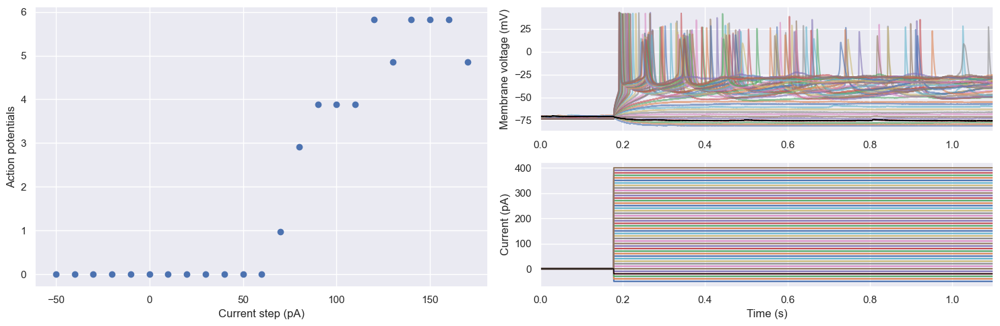

2023_09_20_0028_slice1_cell1_cortex_layer2_100um-citrate_PN_WT


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


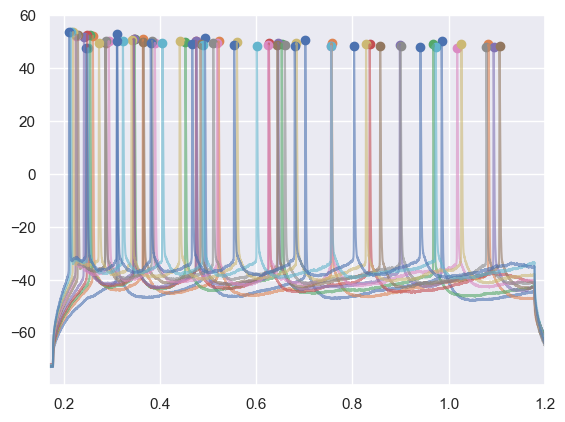

2023_09_20_0028_slice1_cell1_cortex_layer2_100um-citrate_PN_WT


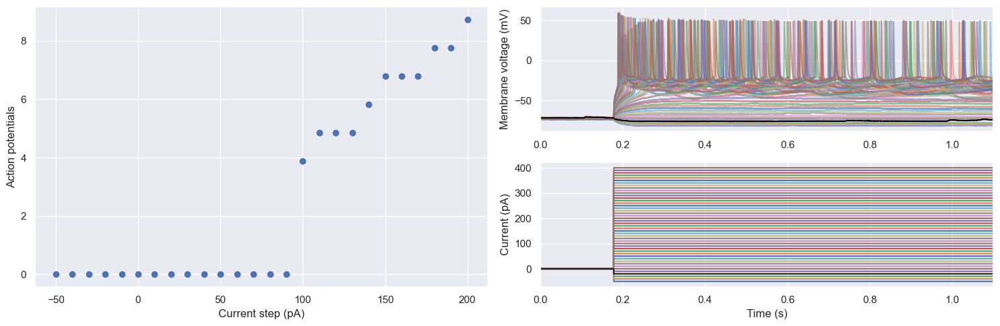

2023_09_20_0043_slice3_cell2_cortex_layer2_no-treatment_PN_WT


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


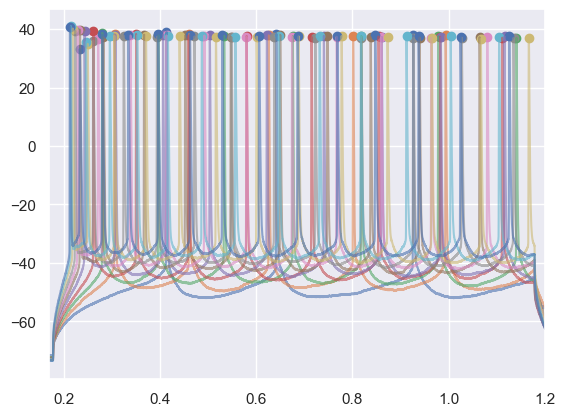

2023_09_20_0043_slice3_cell2_cortex_layer2_no-treatment_PN_WT


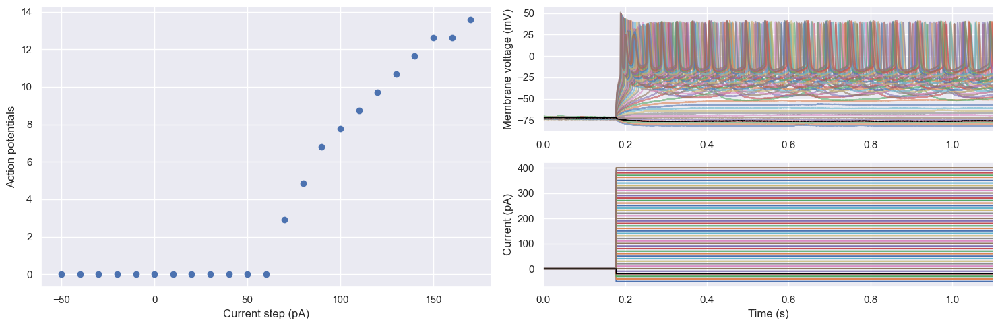

2023_10_01_0036_slice2_cell1_cortex_layer2_200um-citrate_MSN_KO


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
INFO:root:Need to recalculate threshold-peak pair that exceeds maximum allowed interval (0.005000 s)
INFO:root:Could not redetermine threshold-peak pair - dropping that pair
INFO:root:Need to recalculate threshold-peak pair that exceeds maximum allowed interval (0.005000 s)
INFO:root:Could not redetermine threshold-peak pair - dropping that pair
INFO:root:Need to recalculate threshold-peak pair that exceeds maximum allowed interval (0.005000 s)
INFO:root:Could not redetermine threshold-peak pair - dropping that pair
INFO:root:Need to recalculate threshold-peak pair that exceeds maximum allowed interval (0.005000 s)
INFO:root:Could not redetermine threshold-peak pair - dropping that pair


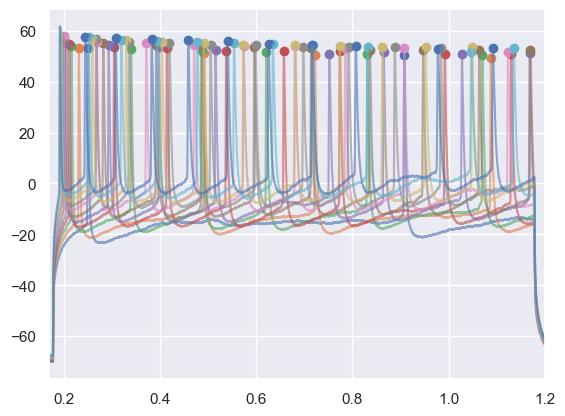

2023_10_01_0036_slice2_cell1_cortex_layer2_200um-citrate_MSN_KO


INFO:root:Need to recalculate threshold-peak pair that exceeds maximum allowed interval (0.005000 s)
INFO:root:Could not redetermine threshold-peak pair - dropping that pair
INFO:root:Need to recalculate threshold-peak pair that exceeds maximum allowed interval (0.005000 s)
INFO:root:Could not redetermine threshold-peak pair - dropping that pair
INFO:root:Need to recalculate threshold-peak pair that exceeds maximum allowed interval (0.005000 s)
INFO:root:Could not redetermine threshold-peak pair - dropping that pair
INFO:root:Need to recalculate threshold-peak pair that exceeds maximum allowed interval (0.005000 s)
INFO:root:Could not redetermine threshold-peak pair - dropping that pair


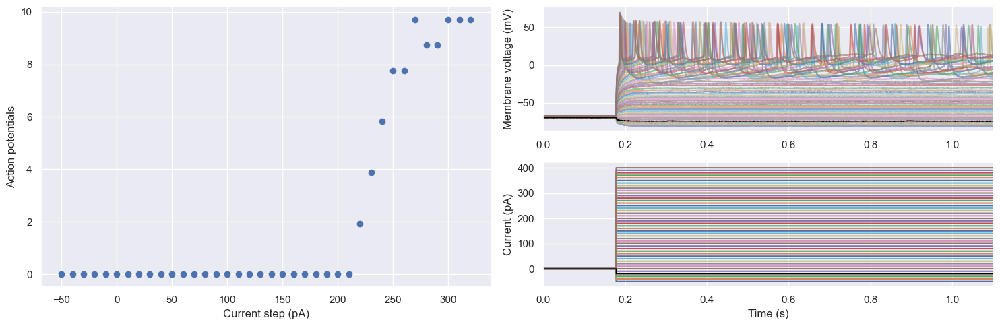

2023_10_01_0032_slice2_cell1_cortex_layer2_50um-citrate_MSN_KO


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


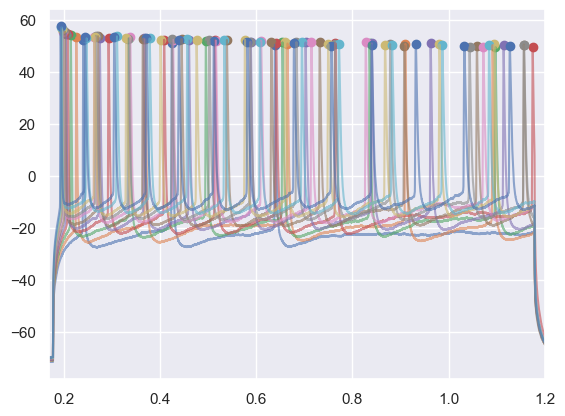

2023_10_01_0032_slice2_cell1_cortex_layer2_50um-citrate_MSN_KO


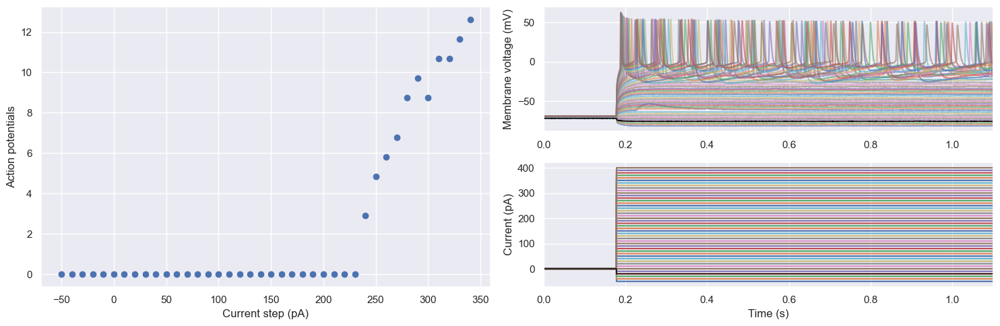

2023_09_20_0034_slice1_cell1_cortex_layer2_400um-citrate_PN_WT


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


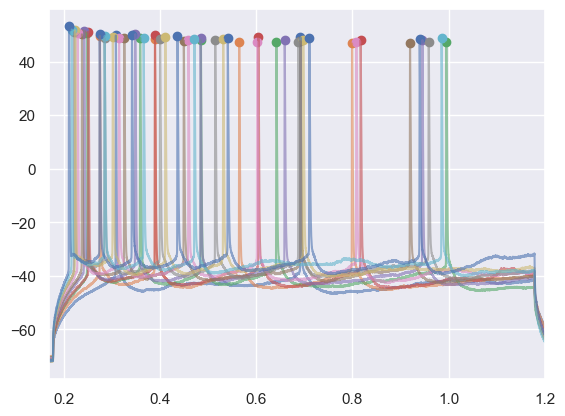

2023_09_20_0034_slice1_cell1_cortex_layer2_400um-citrate_PN_WT


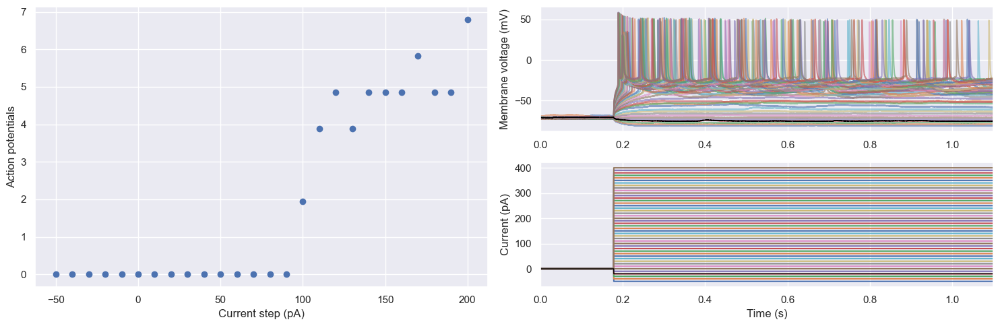

2023_09_27_0056_slice5_cell1_cortex_layer2_no-treatment_PN_WT


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


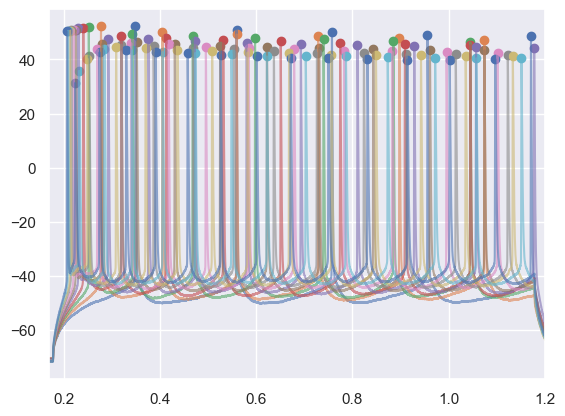

2023_09_27_0056_slice5_cell1_cortex_layer2_no-treatment_PN_WT


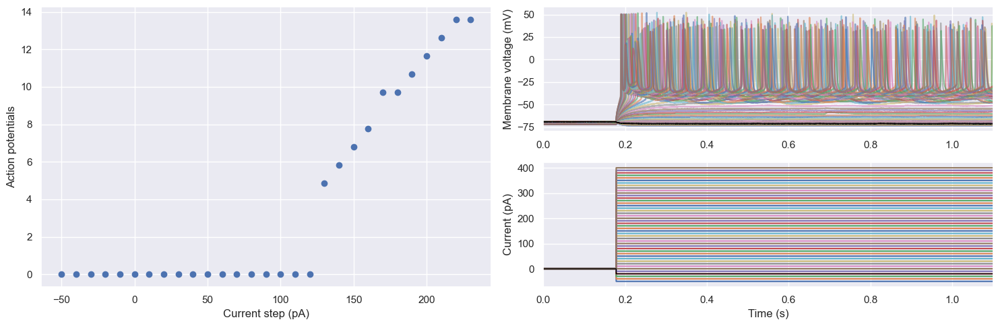

2023_09_27_0054_slice4_cell1_cortex_layer2_400um-citrate_MSN_WT


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


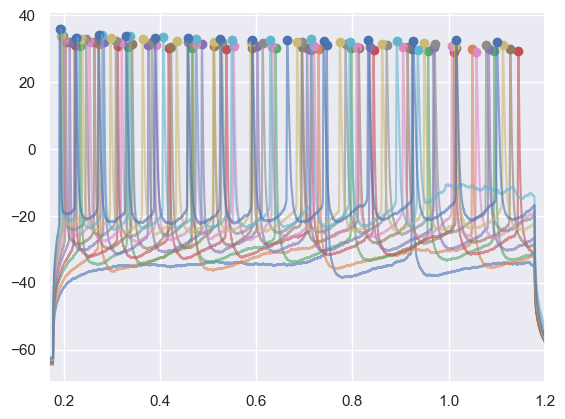

2023_09_27_0054_slice4_cell1_cortex_layer2_400um-citrate_MSN_WT


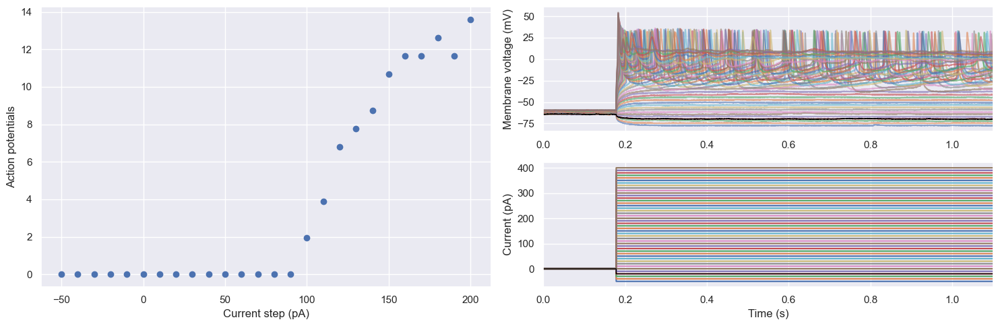

2023_09_27_0042_slice4_cell1_cortex_layer2_25um-citrate_MSN_WT


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


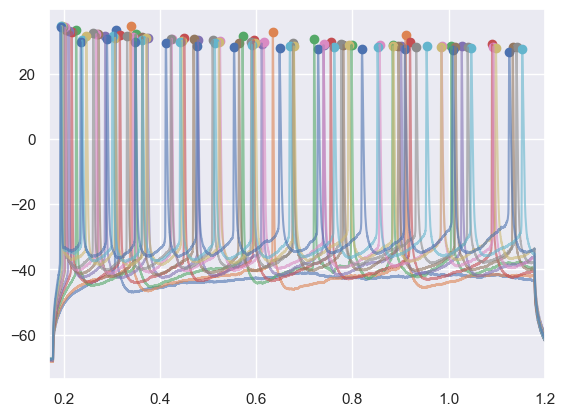

2023_09_27_0042_slice4_cell1_cortex_layer2_25um-citrate_MSN_WT


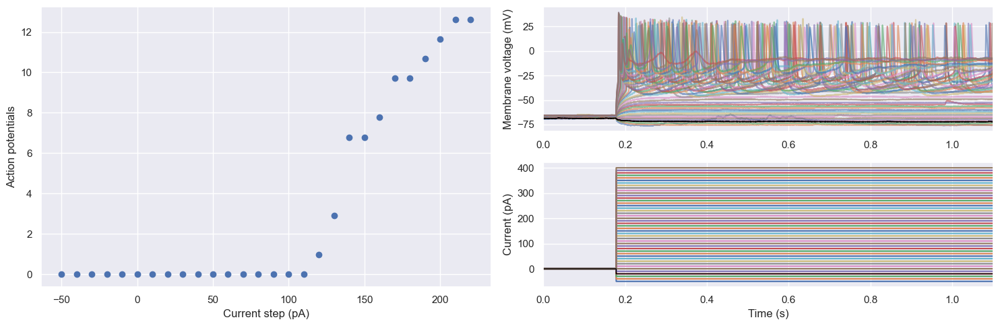

2023_09_27_0068_slice5_cell1_cortex_layer2_200um-citrate_PN_WT


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


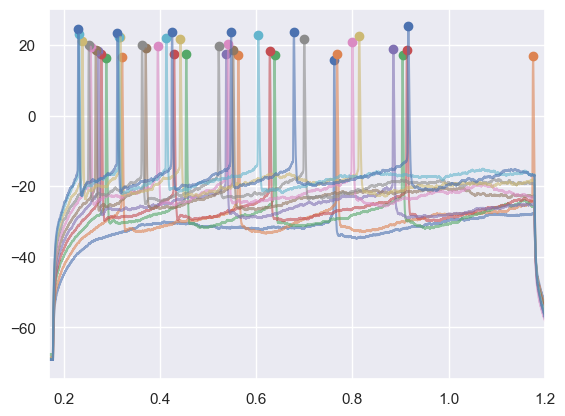

2023_09_27_0068_slice5_cell1_cortex_layer2_200um-citrate_PN_WT


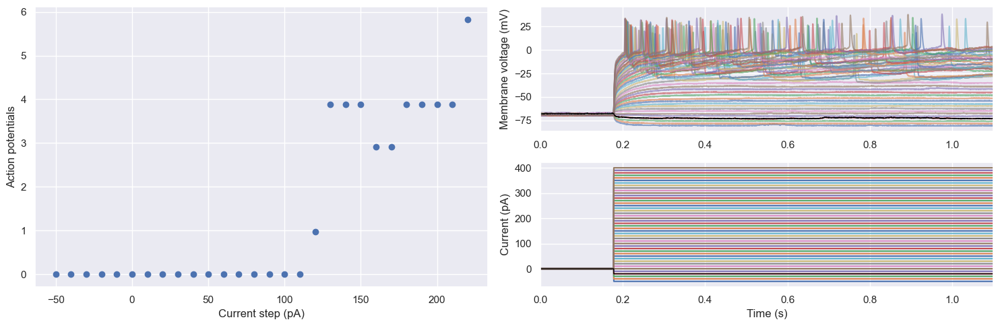

2023_09_20_0055_slice3_cell2_cortex_layer2_200um-citrate_PN_WT


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


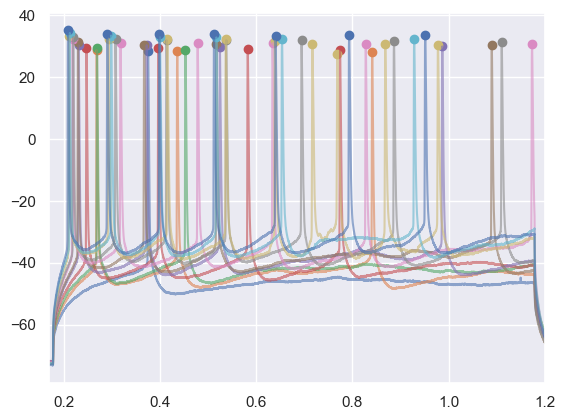

2023_09_20_0055_slice3_cell2_cortex_layer2_200um-citrate_PN_WT


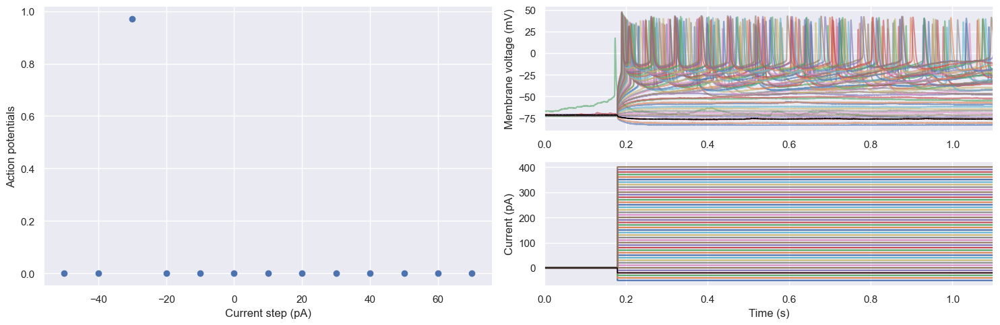

In [163]:
folder_path = '/Users/alicelin/Desktop/abf_files'
file_list = glob.glob(os.path.join(folder_path, "*.abf"))
compiled_indiv = pd.DataFrame()
compiled_agg = pd.DataFrame()
for file in file_list:
    current_file = spike_analysis(file)
    compiled_indiv = pd.concat([compiled_indiv, current_file])
    agg_current = input_output(file)
    compiled_agg = pd.concat([compiled_agg, agg_current])

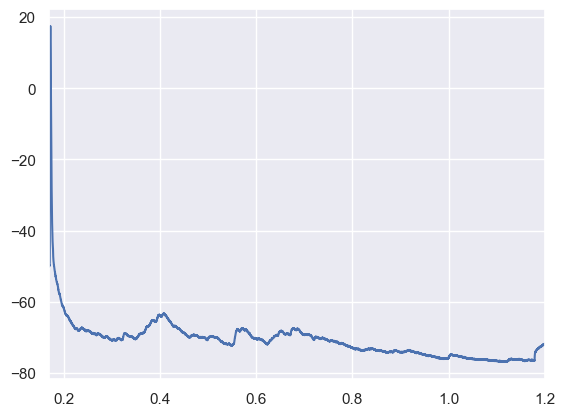

In [164]:
abf = pyabf.ABF('/Users/alicelin/Desktop/abf_files/2023_09_20_0055_slice3_cell2_cortex_layer2_200um-citrate_PN_WT.abf')
abf.setSweep(2)

plt.plot(abf.sweepX, abf.sweepY)
plt.xlim([0.17, 1.2])
plt.show()

In [117]:
compiled

,date,protocol_num,slice,cell,region,layer,treatment,cell_type,animal_genotype,file_name,sweep,threshold_index,clipped,threshold_t,threshold_v,threshold_i,peak_index,peak_t,peak_v,peak_i,trough_index,trough_t,trough_v,trough_i,upstroke_index,upstroke,upstroke_t,upstroke_v,downstroke_index,downstroke,downstroke_t,downstroke_v,isi_type,fast_trough_index,fast_trough_t,fast_trough_v,fast_trough_i,adp_index,adp_t,adp_v,adp_i,slow_trough_index,slow_trough_t,slow_trough_v,slow_trough_i,width,upstroke_downstroke_ratio,r_squared_rise
0,20230927,0065,slice5,cell1,cortex,layer2,100um-citrate,PN,WT,2023_09_27_0065_slice5_cell1_cortex_layer2_100...,18,6308,False,0.31540,-25.787354,130.0,6339,0.31695,20.843506,130.0,7551.0,0.37755,-34.027100,130.0,6316,68.969731,0.31580,-13.580322,6361.0,-21.972656,0.31805,4.608154,detour,6438.0,0.32190,-31.738281,130.0,NaN,NaN,NaN,NaN,7551.0,0.37755,-34.027100,130.0,0.00265,3.138889,0.921651
1,20230927,0065,slice5,cell1,cortex,layer2,100um-citrate,PN,WT,2023_09_27_0065_slice5_cell1_cortex_layer2_100...,18,9950,False,0.49750,-25.665283,130.0,9982,0.49910,21.087646,130.0,10897.0,0.54485,-34.210205,130.0,9959,67.749028,0.49795,-13.641357,10003.0,-21.362305,0.50015,8.544922,detour,10082.0,0.50410,-31.372070,130.0,NaN,NaN,NaN,NaN,10897.0,0.54485,-34.210205,130.0,0.00280,3.171429,0.921651
2,20230927,0065,slice5,cell1,cortex,layer2,100um-citrate,PN,WT,2023_09_27_0065_slice5_cell1_cortex_layer2_100...,18,13530,False,0.67650,-25.360107,130.0,13564,0.67820,21.057129,130.0,14258.0,0.71290,-33.843994,130.0,13539,65.307622,0.67695,-13.000488,13583.0,-20.141602,0.67915,9.033203,detour,13667.0,0.68335,-31.188965,130.0,NaN,NaN,NaN,NaN,14258.0,0.71290,-33.843994,130.0,0.00290,3.242424,0.921651
3,20230927,0065,slice5,cell1,cortex,layer2,100um-citrate,PN,WT,2023_09_27_0065_slice5_cell1_cortex_layer2_100...,18,17004,False,0.85020,-24.963379,130.0,17037,0.85185,21.118164,130.0,17989.0,0.89945,-34.057617,130.0,17012,64.697270,0.85060,-14.068604,17064.0,-19.531250,0.85320,3.051758,detour,17151.0,0.85755,-30.273438,130.0,NaN,NaN,NaN,NaN,17989.0,0.89945,-34.057617,130.0,0.00290,3.312500,0.921651
4,20230927,0065,slice5,cell1,cortex,layer2,100um-citrate,PN,WT,2023_09_27_0065_slice5_cell1_cortex_layer2_100...,18,21530,True,1.07650,-25.054932,130.0,21562,1.07810,20.568848,130.0,23566.0,1.17830,-36.041260,0.0,21538,63.476567,1.07690,-12.451172,23563.0,-23.803711,1.17815,-33.691406,nan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.666667,0.921651
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2,20230920,0055,slice3,cell2,cortex,layer2,200um-citrate,PN,WT,2023_09_20_0055_slice3_cell2_cortex_layer2_200...,25,7946,False,0.39730,-28.381348,200.0,7977,0.39885,33.996582,200.0,8807.0,0.44035,-36.773682,200.0,7957,95.825195,0.39785,-6.866455,8000.0,-17.089845,0.40000,22.094727,detour,8138.0,0.40690,-28.900146,200.0,NaN,NaN,NaN,NaN,8807.0,0.44035,-36.773682,200.0,0.00350,5.607142,0.922838
3,20230920,0055,slice3,cell2,cortex,layer2,200um-citrate,PN,WT,2023_09_20_0055_slice3_cell2_cortex_layer2_200...,25,10221,False,0.51105,-28.259277,200.0,10252,0.51260,33.905029,200.0,11056.0,0.55280,-36.560059,200.0,10233,95.825195,0.51165,-1.892090,10280.0,-17.089845,0.51400,18.920898,detour,10404.0,0.52020,-27.282715,200.0,NaN,NaN,NaN,NaN,11056.0,0.55280,-36.560059,200.0,0.00340,5.607142,0.922838
4,20230920,0055,slice3,cell2,cortex,layer2,200um-citrate,PN,WT,2023_09_20_0055_slice3_cell2_cortex_layer2_200...,25,12773,False,0.63865,-26.855469,200.0,12806,0.64030,33.386230,200.0,13556.0,0.67780,-36.773682,200.0,12786,89.111328,0.63930,-1.434326,12833.0,-17.089845,0.64165,18.798828,detour,12959.0,0.64795,-27.099609,200.0,NaN,NaN,NaN,NaN,13556.0,0.67780,-36.773682,200.0,0.00350,5.214285,0.922838
5,20230920,0055,slice3,cell2,cortex,layer2,200um-citrate,PN,WT,2023_09_20_0055_slice3_cell2_cortex_layer2_200...,25,

[[-72.3267 -72.3267 -72.3572 ... -72.998  -72.937  -72.937 ]
 [-68.9087 -68.9392 -69.0002 ... -69.2444 -69.3054 -69.3359]
 [-65.8569 -65.7959 -65.8264 ... -66.1621 -66.1011 -66.1621]
 ...
 [-75.3784 -75.4395 -75.3479 ... -75.1648 -75.1038 -75.1038]
 [-65.6128 -65.6128 -65.6128 ... -65.6128 -65.6128 -65.6128]
 [-70.3125 -70.3125 -70.343  ... -70.0073 -69.9768 -70.0378]]
[0 0 1 ... 0 1 0]


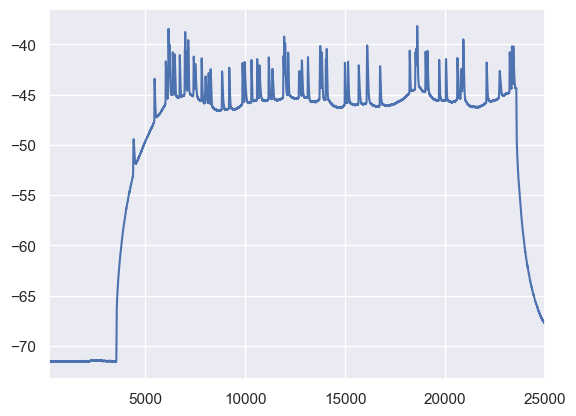

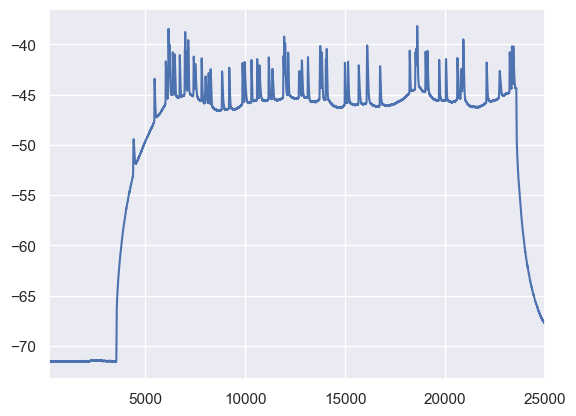

In [54]:

from sklearn.cluster import KMeans
X = np.array(voltage_list)
print(X)
kmeans = KMeans(n_clusters=2, random_state=0).fit(X)
print(kmeans.labels_)
plt.plot(kmeans.cluster_centers_[kmeans.labels_[0]])
plt.xlim([200, 25000])
plt.show()

plt.plot(kmeans.cluster_centers_[kmeans.labels_[1]])
plt.xlim([200, 25000])
plt.show()
#plt.plot(kmeans.cluster_centers_[kmeans.labels_[2]])
#plt.plot(abf2.sweepY, 'r')
# plt.xlim([200, 25000])
# plt.show()

2023_09_27_0054_slice4_cell1_cortex_layer2_400um-citrate_MSN_WT


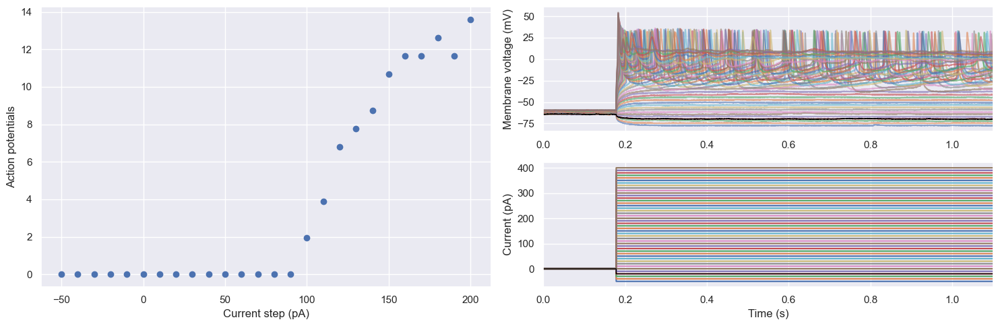

,current_step,avg_rate,date,protocol_num,slice,cell,region,layer,treatment,cell_type,animal_genotype,adaptation,Latency_s,ISI_CV,ISI_mean_ms,ISI_first_ms
0,-50.0,0.000000,20230927,0054,slice4,cell1,cortex,layer2,400um-citrate,MSN,WT,NaN,NaN,NaN,NaN,NaN
1,-40.0,0.000000,20230927,0054,slice4,cell1,cortex,layer2,400um-citrate,MSN,WT,NaN,NaN,NaN,NaN,NaN
2,-30.0,0.000000,20230927,0054,slice4,cell1,cortex,layer2,400um-citrate,MSN,WT,NaN,NaN,NaN,NaN,NaN
3,-20.0,0.000000,20230927,0054,slice4,cell1,cortex,layer2,400um-citrate,MSN,WT,NaN,NaN,NaN,NaN,NaN
4,-10.0,0.000000,20230927,0054,slice4,cell1,cortex,layer2,400um-citrate,MSN,WT,NaN,NaN,NaN,NaN,NaN
5,0.0,0.000000,20230927,0054,slice4,cell1,cortex,layer2,400um-citrate,MSN,WT,NaN,NaN,NaN,NaN,NaN
6,10.0,0.000000,20230927,0054,slice4,cell1,cortex,layer2,400um-citrate,MSN,WT,NaN,NaN,NaN,NaN,NaN
7,20.0,0.000000,20230927,0054,slice4,cell1,cortex,layer2,400um-citrate,MSN,WT,NaN,NaN,NaN,NaN,NaN
8,30.0,0.000000,20230927,0054,slice4,cell1,cortex,layer2,400um-citrate,MSN,WT,NaN,NaN,NaN,NaN,NaN
9,40.0,0.000000,20230927,0054,slice4,cell1,cortex,layer2,400um-citrate,MSN,WT,NaN,NaN,NaN,NaN,NaN


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]
/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexe

NameError: name 'rheobase' is not defined

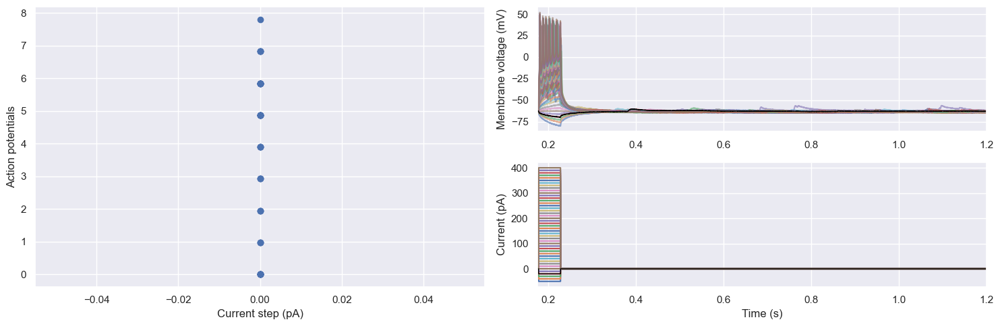

In [5]:

      

fig1 = plt.figure(figsize=(15, 5))
 
# Input-output curve
ax1 = fig1.add_subplot(1, 2, 1)
currents = []
for sweep in abf.sweepList:
    abf.setSweep(sweep)
    currents.append(np.average(abf.sweepC[t1:t2]))
ax1.scatter(currents, table.loc[:,'avg_rate'])
ax1.set_xlabel('Current step (pA)')
ax1.set_ylabel('Action potentials')
 
# All traces
ax2 = fig1.add_subplot(2, 2, 2)
for sweep in abf.sweepList:
    abf.setSweep(sweep)
    ax2.plot(abf.sweepX, abf.sweepY, alpha=.6, label="Sweep %d" % (sweep))
ax2.set_ylabel('Membrane voltage (mV)')
# ax2.legend() # Optional
# To highllight one trace
abf.setSweep(3) 
ax2.plot(abf.sweepX, abf.sweepY, linewidth=1, color='black')
ax2.axes.set_xlim(0.175, 1.2) # Range of the x-axis (seconds)
 
# All current steps
ax3 = fig1.add_subplot(2, 2, 4, sharex=ax2) 
for sweep in abf.sweepList:
    abf.setSweep(sweep)
    current = abf.sweepC
    ax3.plot(abf.sweepX, current)
ax3.set_ylabel("Current (pA)")
ax3.set_xlabel("Time (s)")
# To highllight one current trace
abf.setSweep(3) 
ax3.plot(abf.sweepX, abf.sweepC, linewidth=1, color='black')
fig1.tight_layout()

# Inputs (the abf file, sweep number, sampling rate, half-window in ms)
dv_dt40 = dv_dt(abf, rheobase+4, 20000, 12)
# Table with the voltage and dV/dt values
table40 = pd.DataFrame(columns = ['voltage', 'dv_dt'])
table40['voltage'] = pd.Series(dv_dt40['voltage'])
table40['dv_dt'] = pd.Series(dv_dt40['dv_dt'])

# Inputs (the abf file, sweep number, sampling rate, half-window in ms)
dv_dt80 = dv_dt(abf, rheobase+8, 20000, 12)
# Table with the voltage and dV/dt values
table80 = pd.DataFrame(columns = ['voltage', 'dv_dt'])
table80['voltage'] = pd.Series(dv_dt80['voltage'])
table80['dv_dt'] = pd.Series(dv_dt80['dv_dt'])
 
# Graphs
fig2 = plt.figure(figsize=(6, 3))
# Action potential
ax1 = fig2.add_subplot(121)
ax1.set_title('Action potential Rheobase + 40pA')
ax1.plot(dv_dt40['time'], dv_dt40['voltage'])
ax1.set_ylabel("V (mV)") 
ax1.set_xlabel("t (s)")
 
# Phase plot
ax2 =fig2.add_subplot(122)
ax2.set_title('Phase-plane plot Rheobase + 40pA')
ax2.plot(dv_dt40['voltage_array'], dv_dt40['dv_dt'])
ax2.set_ylabel("dV/dt (mV/ms)") 
ax2.set_xlabel("V (mV)") 

# Graphs
fig3 = plt.figure(figsize=(6, 3))
# Action potential
ax1 = fig3.add_subplot(121)
ax1.set_title('Action potential Rheobase + 80pA')
ax1.plot(dv_dt80['time'], dv_dt80['voltage'])
ax1.set_ylabel("V (mV)") 
ax1.set_xlabel("t (s)")
 
# Phase plot
ax2 =fig3.add_subplot(122)
ax2.set_title('Phase-plane plot Rheobase + 80pA')
ax2.plot(dv_dt80['voltage_array'], dv_dt80['dv_dt'])
ax2.set_ylabel("dV/dt (mV/ms)") 
ax2.set_xlabel("V (mV)") 
 
# Show maximum dv/dt value, graph and table
print('dv/dt max =', dv_dt40['dv_dt_max'])
 
# Optional: Export the graph (png) and the table (csv)
#fig.savefig("Path/to/file/filename.png", dpi=300)
#table.to_csv('Path/to/file/filename.csv')
 
# Show the graph and the table results 
plt.show()
table

2023_09_20_0036.abf


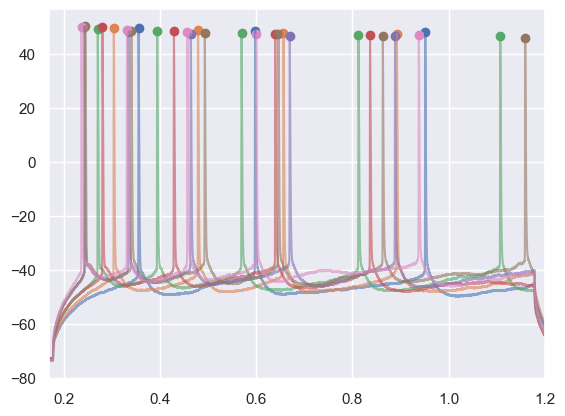

2023_09_20_0021.abf


/Users/alicelin/opt/anaconda3/envs/ephys/lib/python3.7/site-packages/ipfx/spike_features.py:87: RuntimeWarning: invalid value encountered in less
  width_levels[width_levels < v[spike_indexes]] = thresh_to_peak_levels[width_levels < v[spike_indexes]]


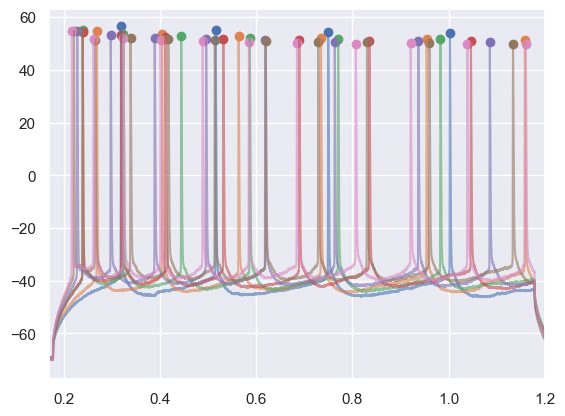

2023_09_27_0051.abf


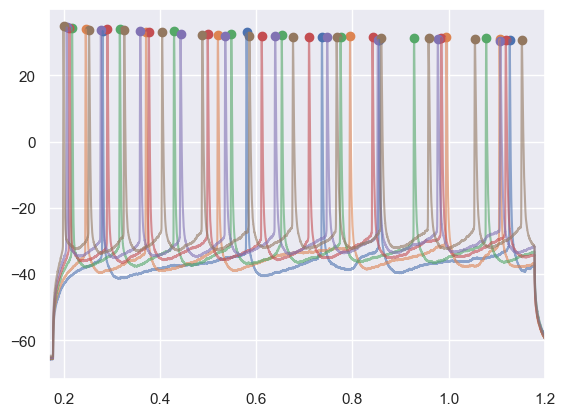

2023_09_27_0045.abf


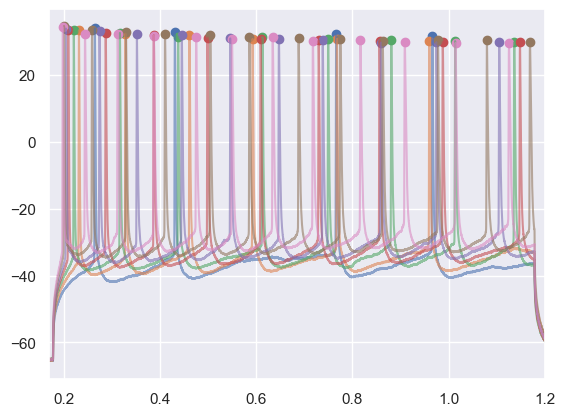

2023_09_20_0034.abf


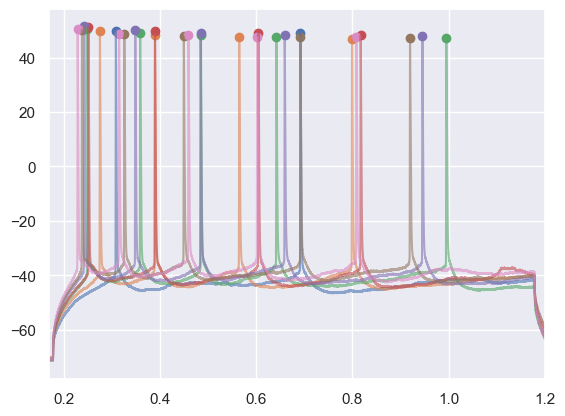

2023_09_20_0024.abf


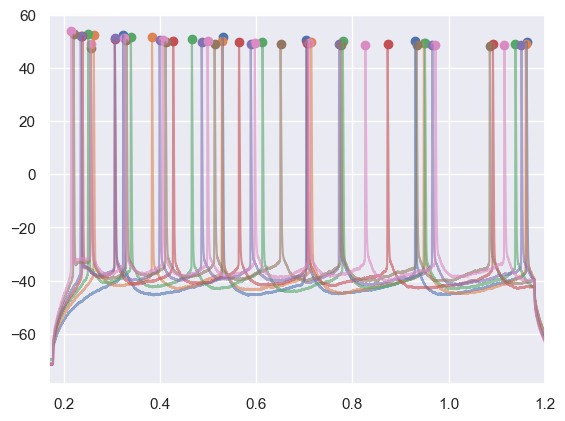

2023_09_20_0018.abf


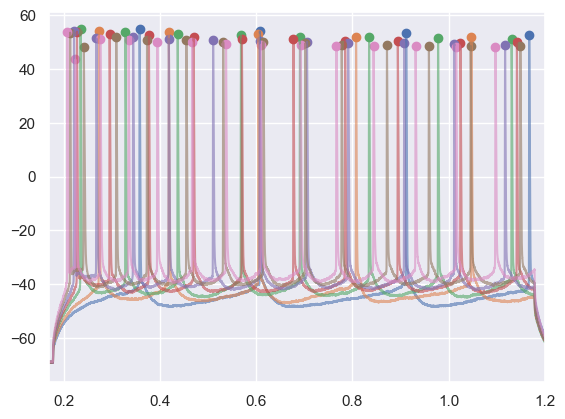

2023_09_27_0054.abf


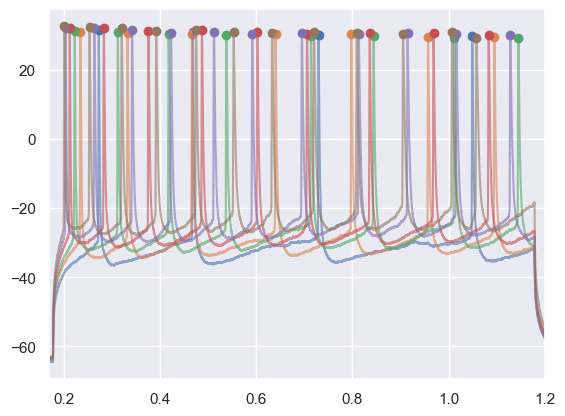

2023_09_27_0068.abf


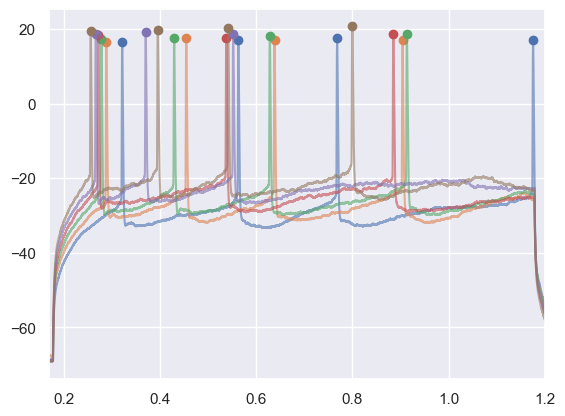

2023_09_20_0031.abf


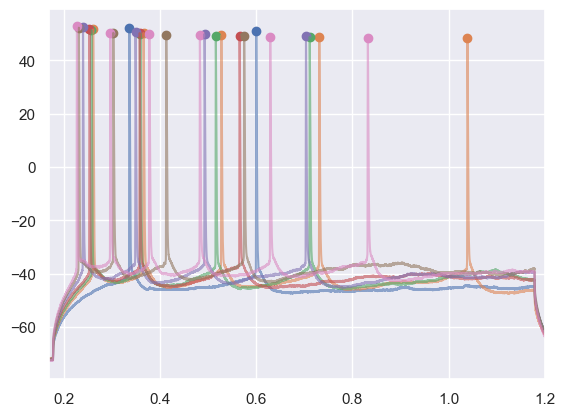

2023_09_27_0056.abf


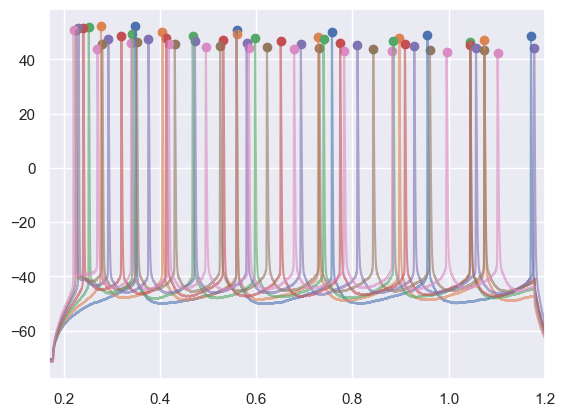

2023_09_27_0042.abf


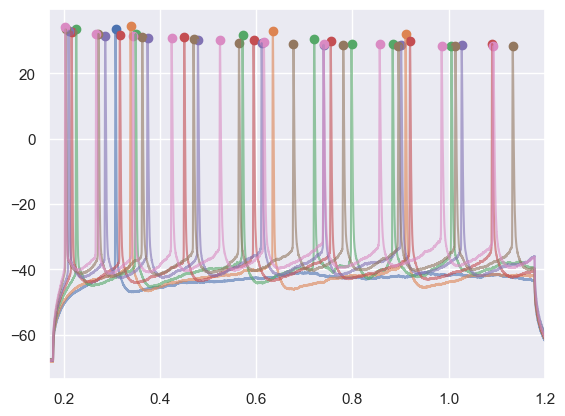

2023_09_20_0055.abf


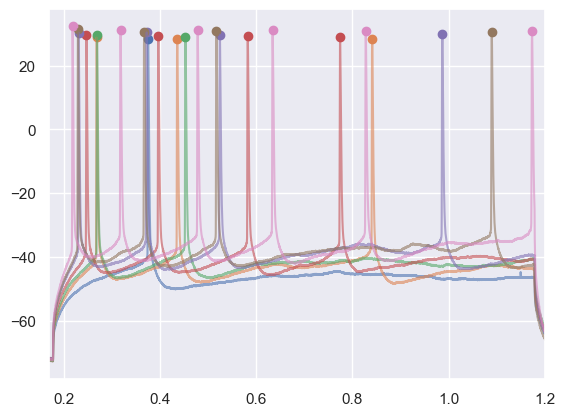

2023_09_27_0019.abf


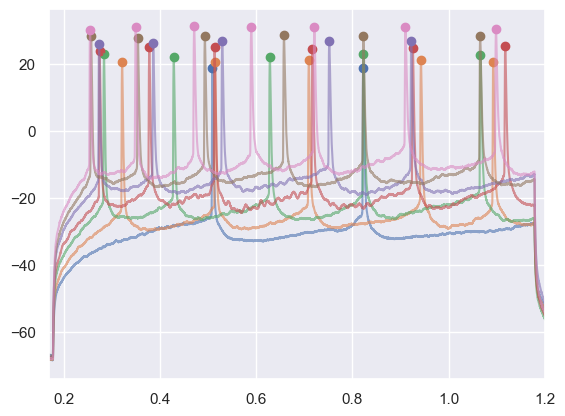

2023_09_20_0043.abf


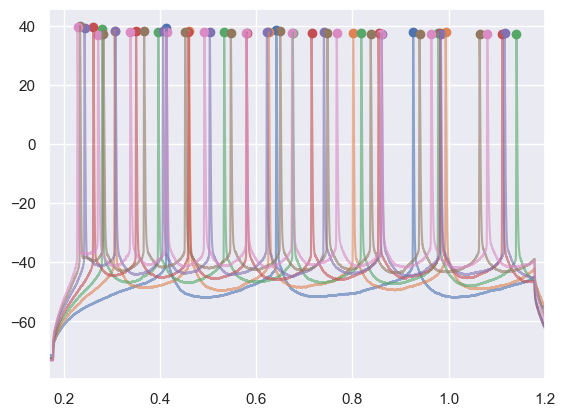

2023_10_01_0028.abf


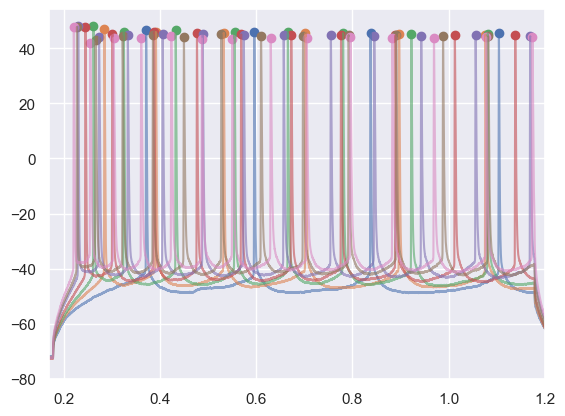

2023_09_20_0046.abf


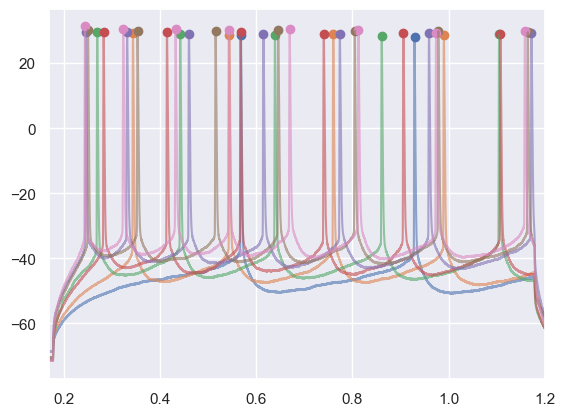

2023_09_20_0052.abf


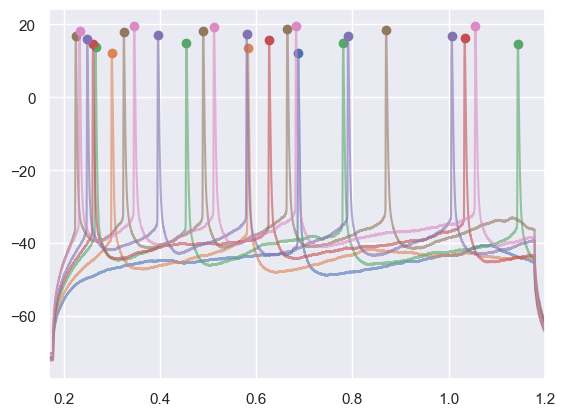

2023_09_27_0039.abf


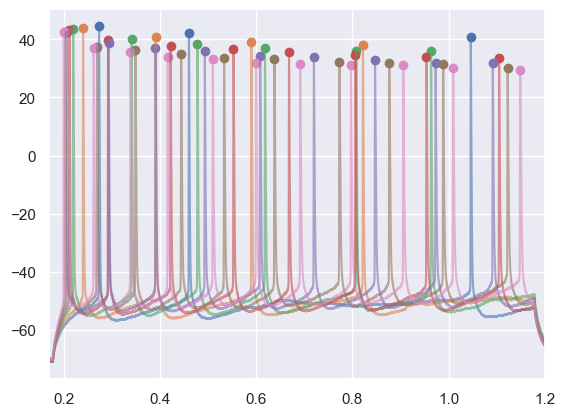

2023_09_27_0010.abf


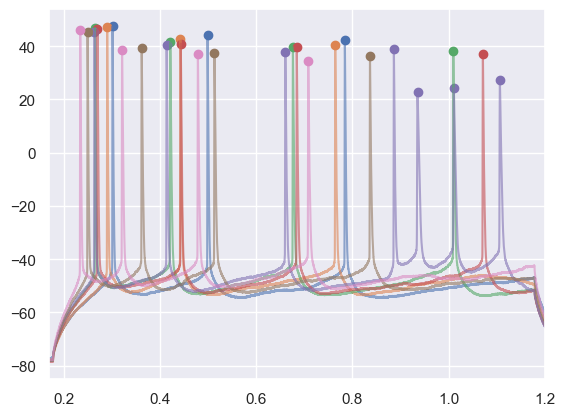

2023_10_01_0032.abf


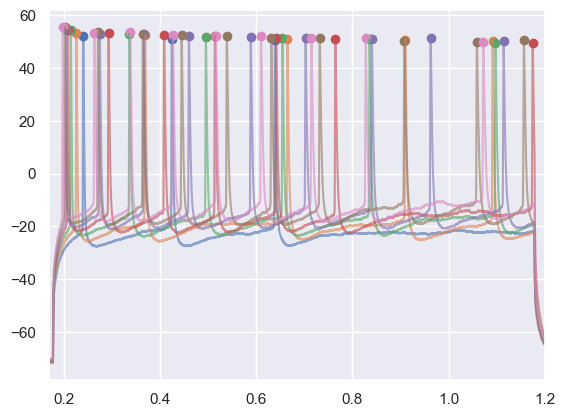

2023_09_20_0049.abf


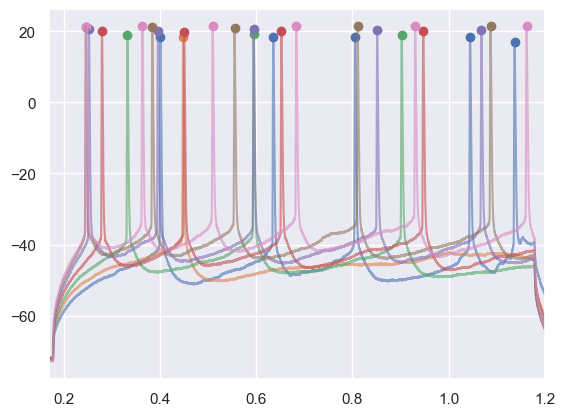

2023_09_27_0013.abf


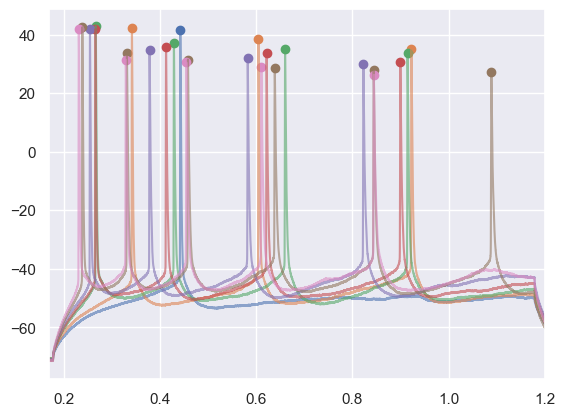

2023_10_01_0031.abf


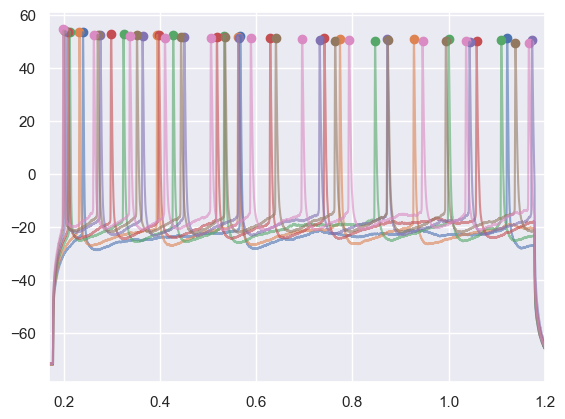

2023_10_01_0035.abf


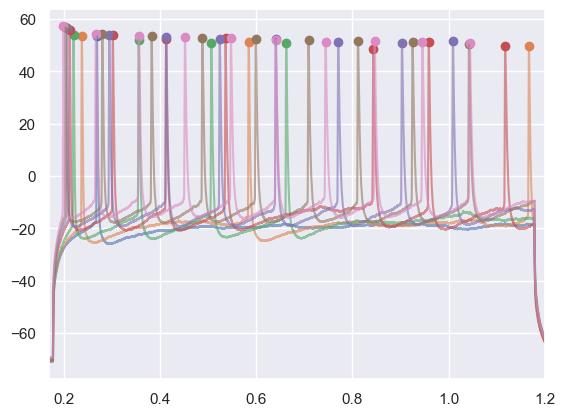

2023_09_27_0016.abf


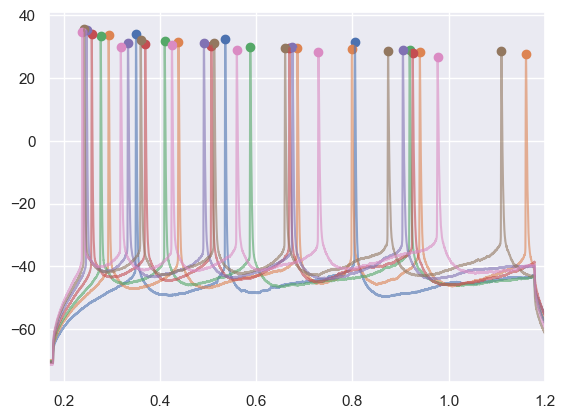

2023_10_01_0036.abf


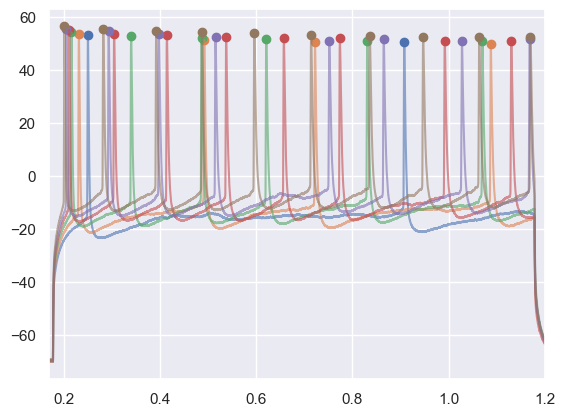

2023_09_20_0028.abf


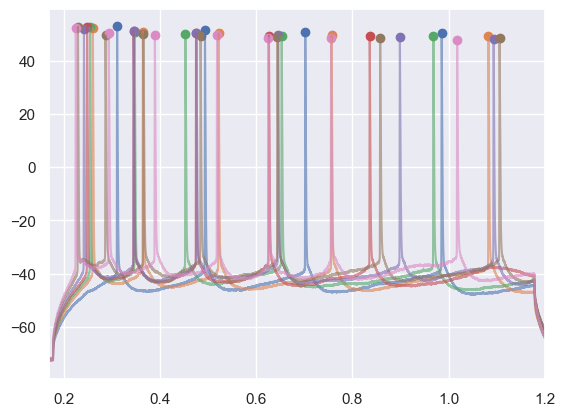

2023_09_21_0000.abf


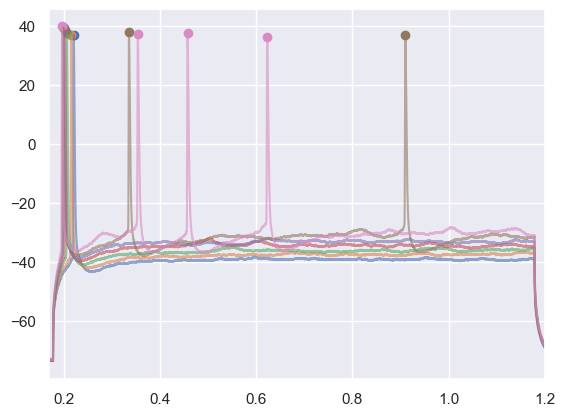

2023_09_27_0065.abf


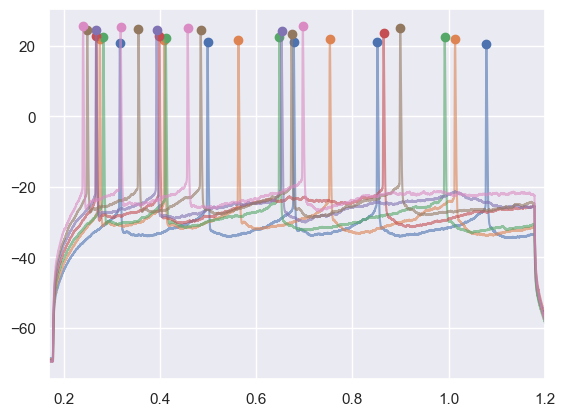

2023_09_27_0071.abf


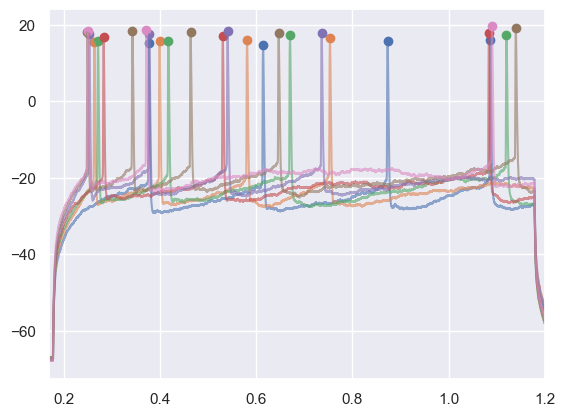

2023_09_27_0059.abf


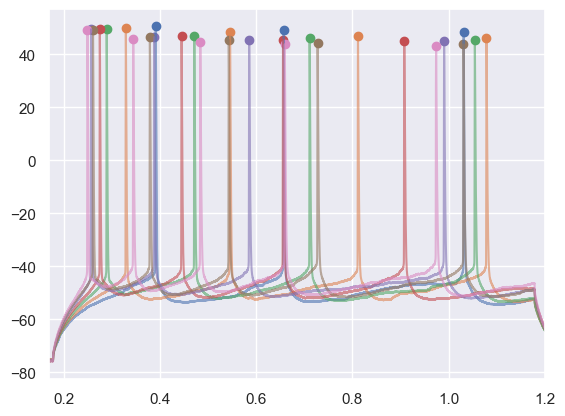

2023_09_27_0048.abf


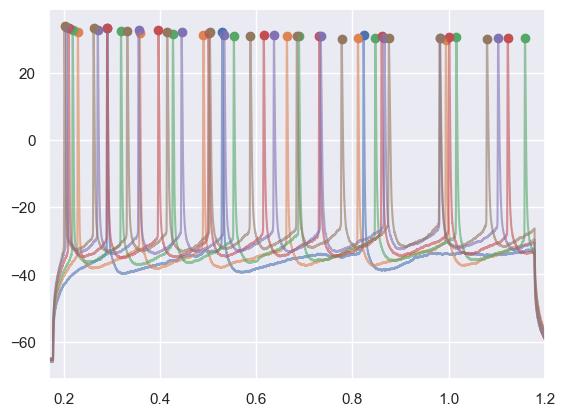

2023_09_27_0062.abf


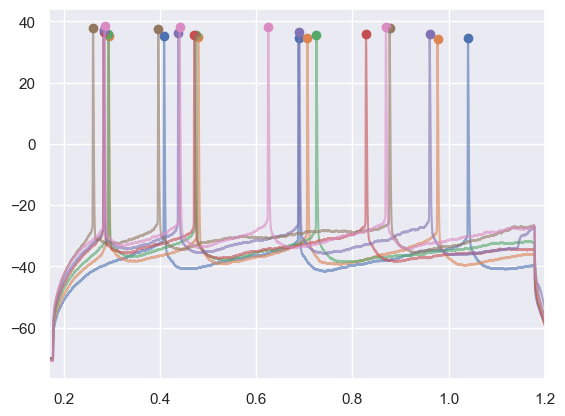

0.17815


Text(0.5, 0, 'V (mV)')

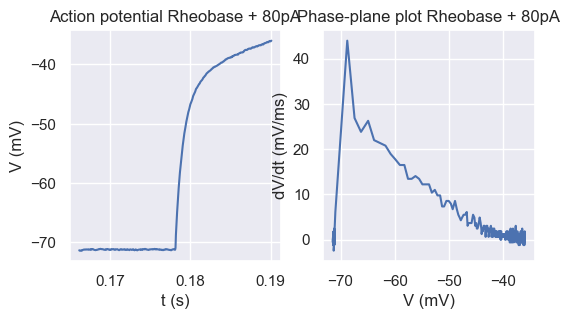

In [46]:
abf = pyabf.ABF('/Users/alicelin/Desktop/abf_files/2023_10_01_0039.abf')

# Inputs (the abf file, sweep number, sampling rate, half-window in ms)
dv_dt80 = dv_dt(abf, 20, 20000, 12)
# Table with the voltage and dV/dt values
table80 = pd.DataFrame(columns = ['voltage', 'dv_dt'])
table80['voltage'] = pd.Series(dv_dt80['voltage'])
table80['dv_dt'] = pd.Series(dv_dt80['dv_dt'])

# Graphs
fig3 = plt.figure(figsize=(6, 3))
# Action potential
ax1 = fig3.add_subplot(121)
ax1.set_title('Action potential Rheobase + 80pA')
ax1.plot(dv_dt80['time'], dv_dt80['voltage'])
ax1.set_ylabel("V (mV)") 
ax1.set_xlabel("t (s)")
 
# Phase plot
ax2 =fig3.add_subplot(122)
ax2.set_title('Phase-plane plot Rheobase + 80pA')
ax2.plot(dv_dt80['voltage_array'], dv_dt80['dv_dt'])
ax2.set_ylabel("dV/dt (mV/ms)") 
ax2.set_xlabel("V (mV)") 
 
